##Importing relevant libraries

In [170]:
import numpy as np
import matplotlib.pyplot as plt
import random
import math as m

## Complex coupling

In [171]:
def complex_coupling (r1, r2, phi1, phi2, omega, mu, A, theta):
    dr1_dt = (mu - r1**2)*r1 + A*r2*np.cos(phi2-phi1+theta)
    dphi1_dt = omega +A*(r2/r1)*np.sin(phi2-phi1+theta)
    dr2_dt = (mu - r2**2)*r2 + A*r1*np.cos(phi1-phi2+theta)
    dphi2_dt = omega +A*(r1/r2)*np.sin(phi1-phi2+theta)
    return dr1_dt, dphi1_dt, dr2_dt, dphi2_dt

## Integration for complex coupling

In [172]:
def euler_integration_complex (r1, phi1, r2, phi2, omega, mu, A, theta, dt, tn):
    n = int(tn / dt)
    r1hist = []
    r2hist = []
    phi1hist = []
    phi2hist = []

    for i in range (n):

        dr1 = complex_coupling(r1, r2, phi1, phi2, omega, mu, A, theta)[0] * dt
        dphi1 = complex_coupling(r1, r2, phi1, phi2, omega, mu, A, theta)[1] * dt
        dr2 = complex_coupling(r1, r2, phi1, phi2, omega, mu, A, theta)[2] * dt
        dphi2 = complex_coupling(r1, r2, phi1, phi2, omega, mu, A, theta)[3] * dt

        r1+=dr1
        phi1+=dphi1
        r2+=dr2
        phi2+=dphi2

        r1hist.append (r1)
        phi1hist.append (phi1)
        r2hist.append (r2)
        phi2hist.append (phi2)

    return r1hist, phi1hist, r2hist, phi2hist

## Randomising the initial values of r and phi

In [173]:
def initial(seed):
    random.seed(seed)
    r1 = random.random()
    phi1 = random.uniform (0, 2*(m.pi))
    r2 = random.random()
    phi2 = random.uniform (0, 2*(m.pi))
    return r1, phi1, r2, phi2

## Plotting real(z) as a function of time

In [174]:
def plot_realz_t (r1_t, phi1_t, r2_t, phi2_t, dt):
    x = []
    y1 = []
    y2 = []

    for i in range (len(r1_t)):
        y1.append(r1_t[i]*np.cos(phi1_t[i]))
        y2.append(r2_t[i]*np.cos(phi2_t[i]))
        x.append (dt*i)

    plt.figure()
    plt.plot (x, y1)
    plt.plot (x, y2)
    plt.xlabel("time")
    plt.ylabel("real(z)")
    plt.legend(["z1", "z2"])

    plt.grid()
    plt.show()

## Plotting the phase change

In [175]:
def plot_phase_diff(phi1_tv, phi2_tv, theta, dt):
    num_trajectories = len(phi1_tv)
    time_points = np.arange(0, len(phi1_tv[0]) * dt, dt)

    plt.figure()

    for i in range(num_trajectories):
        phi1_t = phi1_tv[i]
        phi2_t = phi2_tv[i]
        phase_diff = []
        for j in range (len(phi1_t)):
            phase_diff.append(phi1_t[j] - phi2_t[j])
        plt.plot(time_points, phase_diff)

    plt.xlabel("Time")
    plt.ylabel("phi1 - phi2 - theta")
    plt.axhline(y = m.pi, color = 'black', linestyle = '-')
    plt.axhline(y =-m.pi, color = 'black', linestyle = '-')
    plt.axhline(y = 0, color = 'black', linestyle = '-')
    plt.legend()
    plt.grid()

## Case 1
A = 0.2 and theta = -47 deg

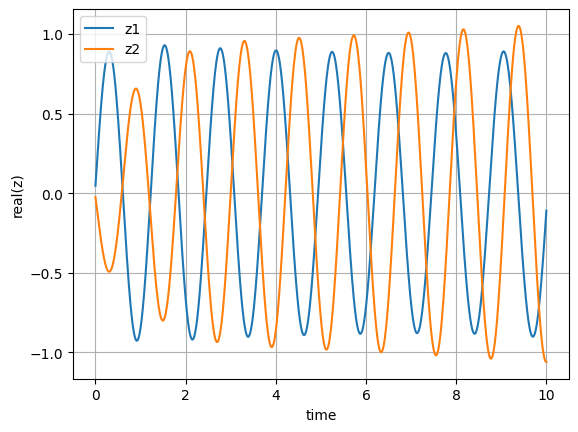

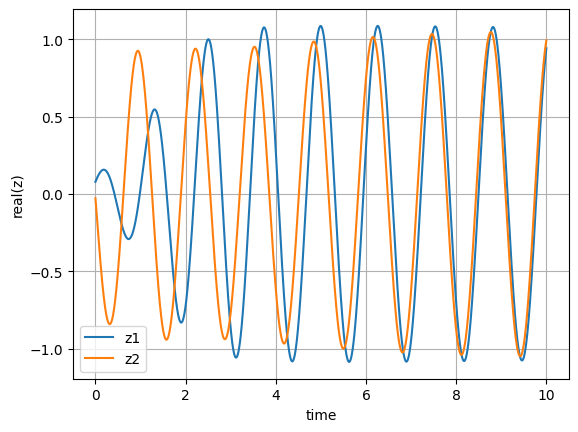

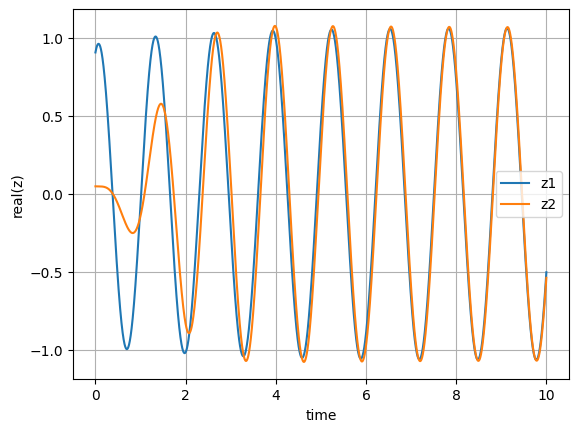

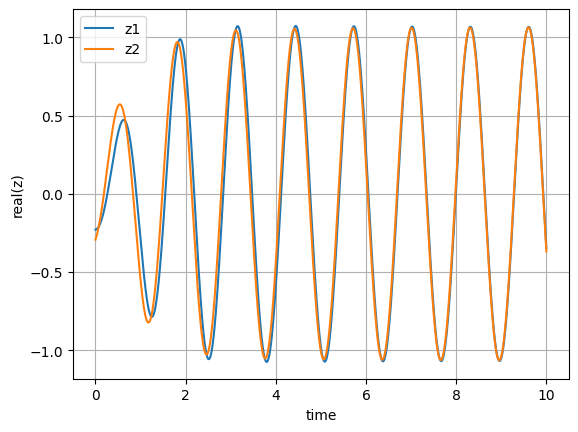

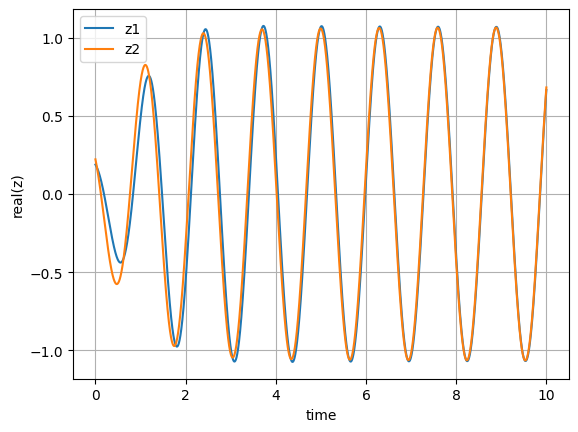

...

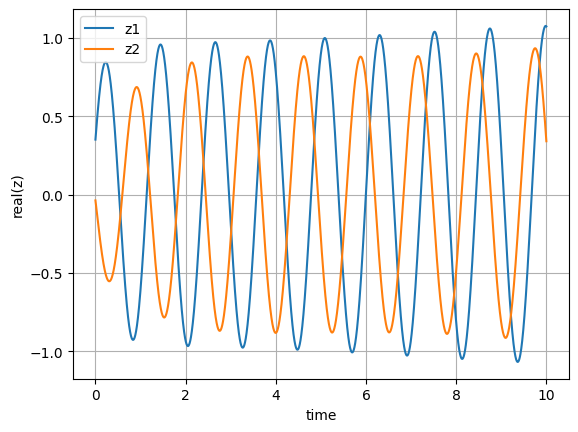

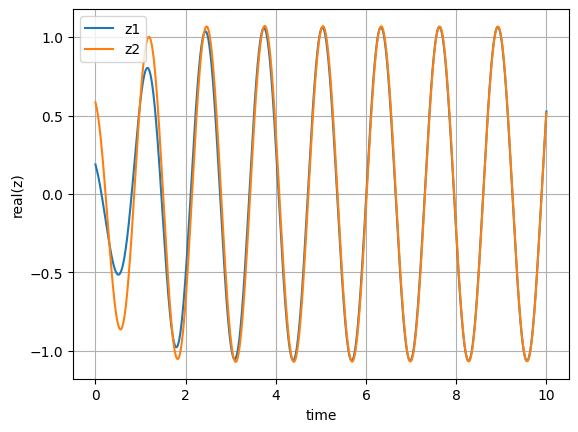

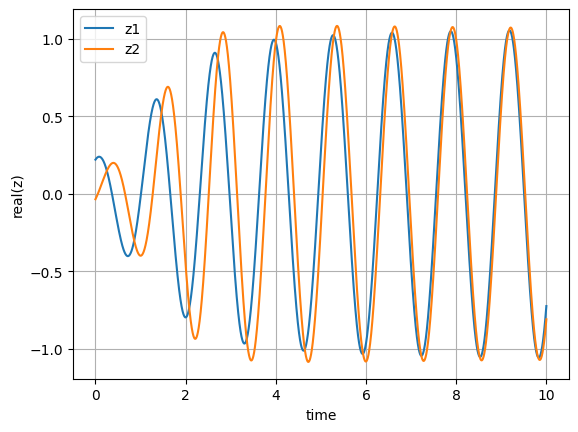

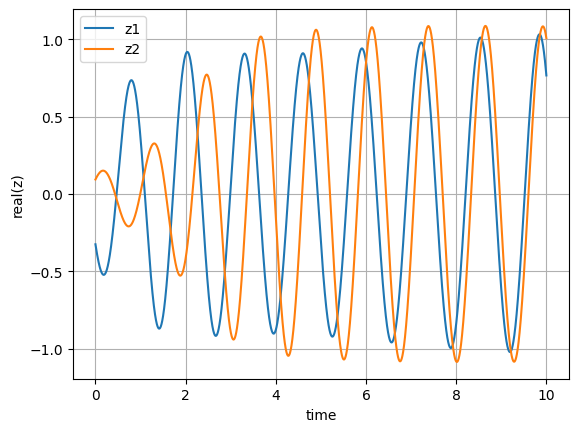

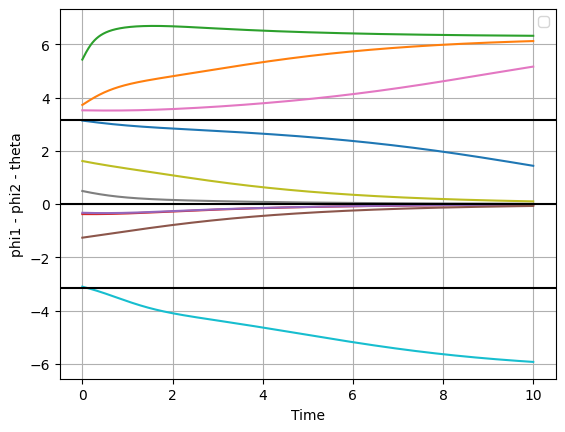

In [176]:
dt = 0.001
tn = 10
omega = 5
mu = 1
A = 0.2
theta = np.deg2rad(-47)

r1_tv = []
phi1_tv = []
r2_tv = []
phi2_tv = []

for i in range (10):
    r1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[0])
    phi1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[1])
    r2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[2])
    phi2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tv[i], phi1_tv[i], r2_tv[i], phi2_tv[i], dt)
plot_phase_diff(phi1_tv, phi2_tv, theta, dt)

## Case 2
A = 0.5 and theta = -47 deg

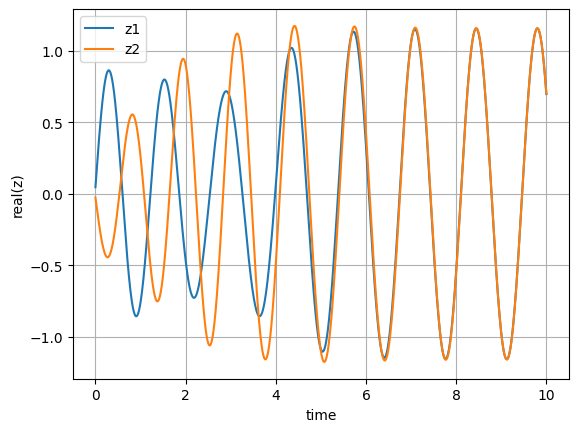

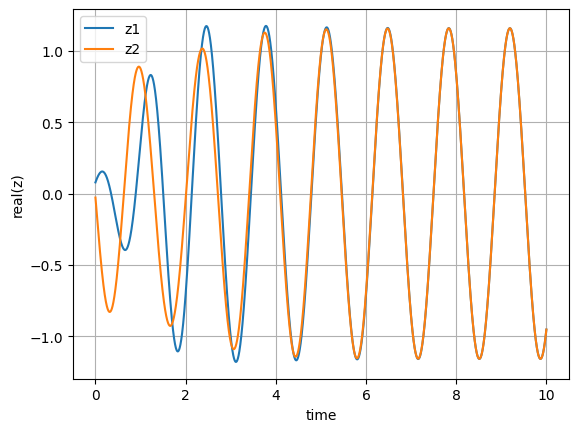

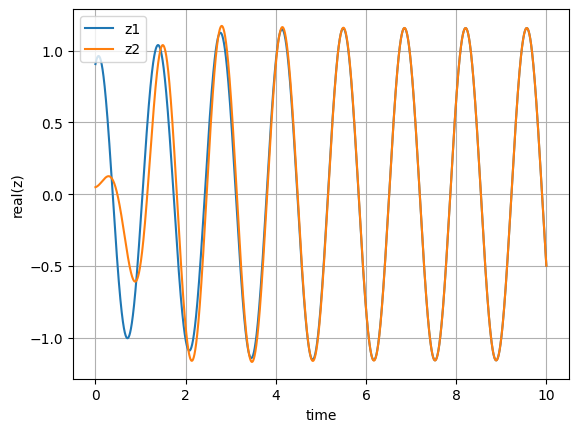

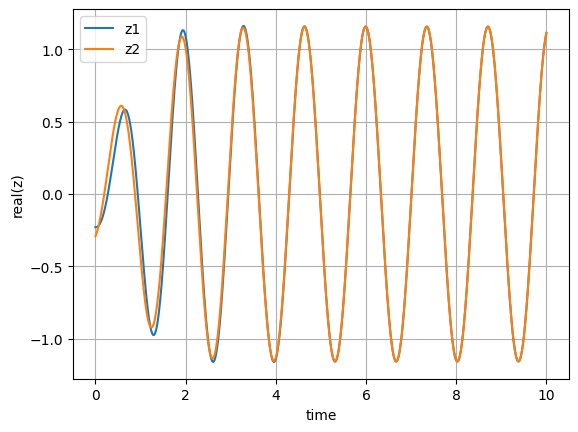

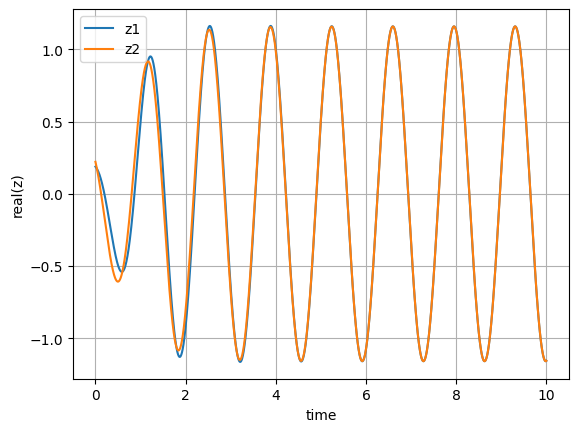

...

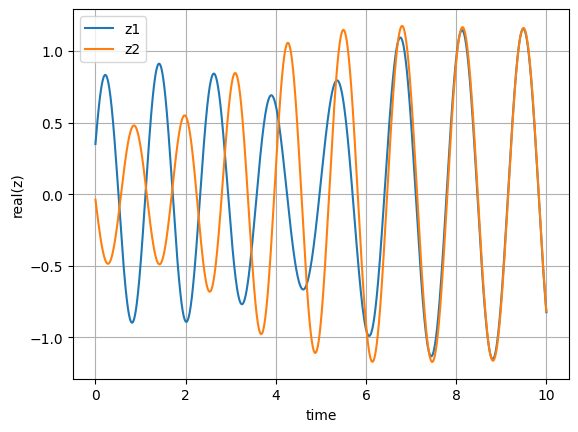

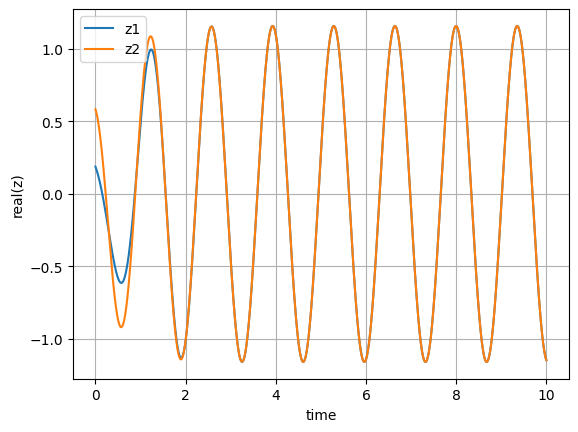

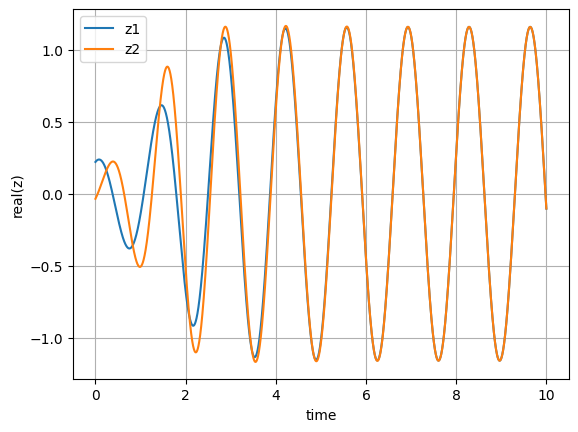

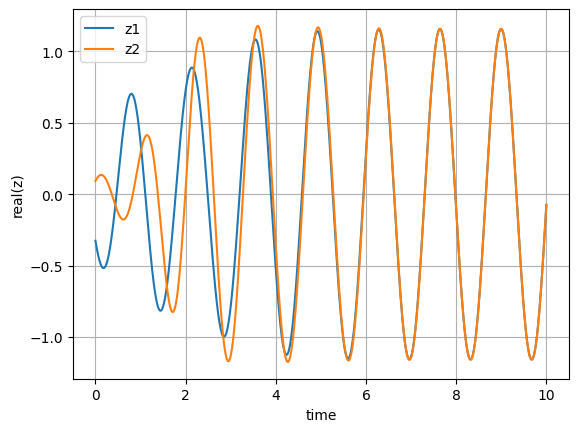

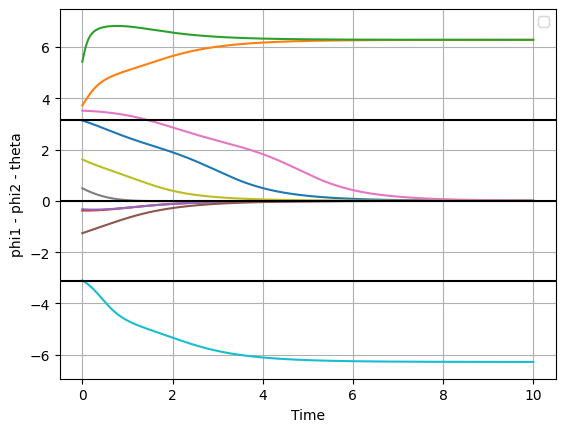

In [177]:
dt = 0.001
tn = 10
omega = 5
mu = 1
A = 0.5
theta = np.deg2rad(-47)

r1_tv = []
phi1_tv = []
r2_tv = []
phi2_tv = []

for i in range (10):
    r1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[0])
    phi1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[1])
    r2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[2])
    phi2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tv[i], phi1_tv[i], r2_tv[i], phi2_tv[i], dt)
plot_phase_diff(phi1_tv, phi2_tv, theta, dt)

## Case 3
A = 0.8 and theta = -47 deg

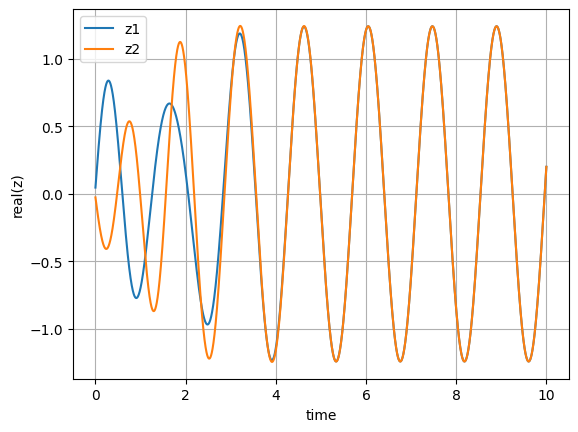

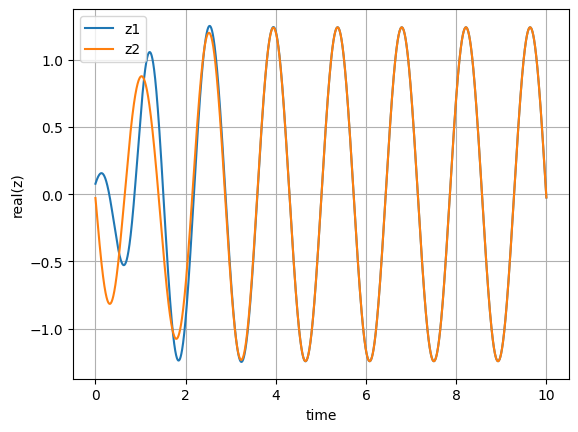

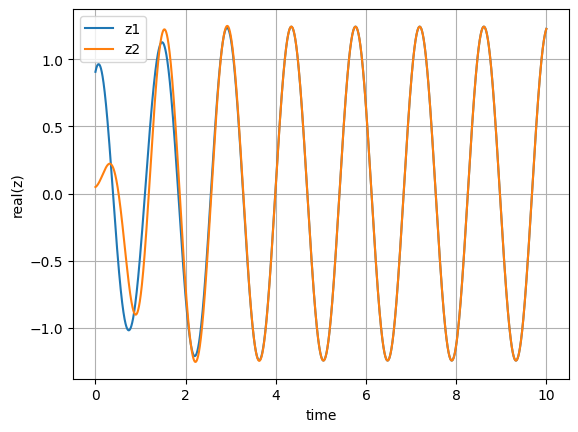

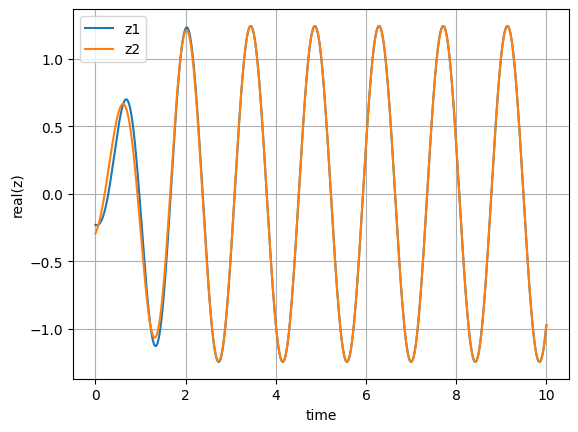

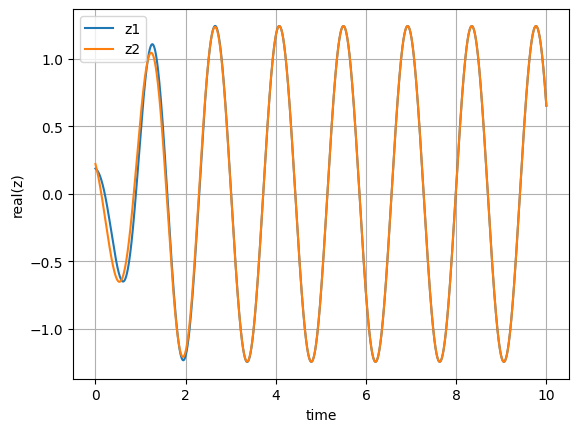

...

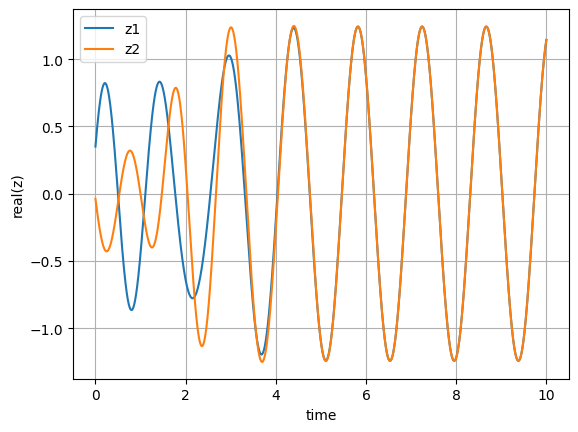

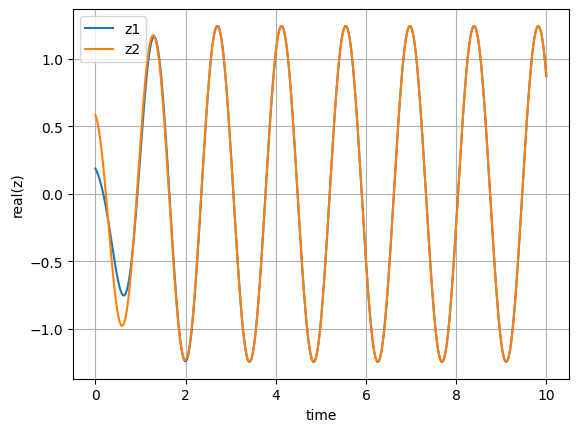

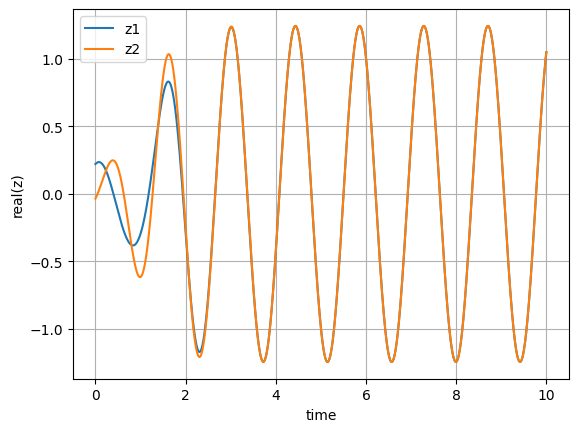

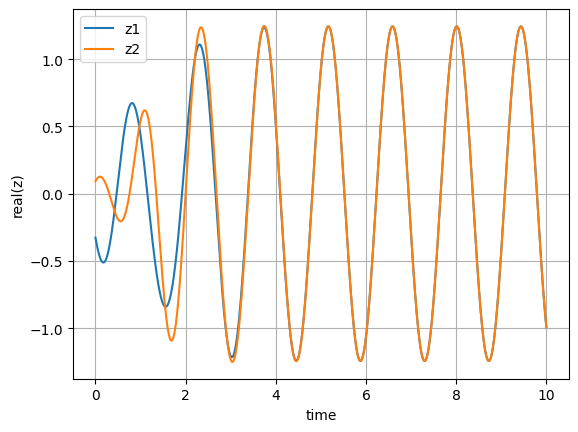

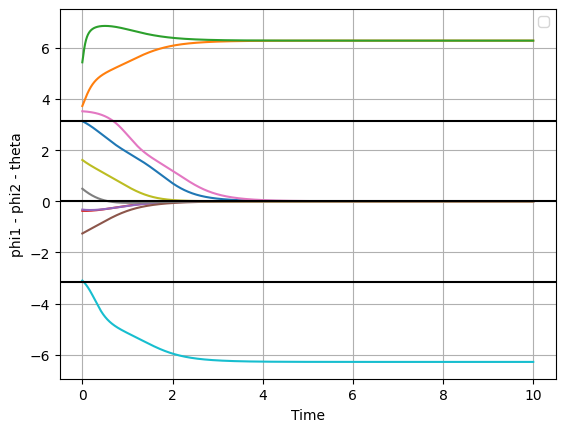

In [178]:
dt = 0.001
tn = 10
omega = 5
mu = 1
A = 0.8
theta = np.deg2rad(-47)

r1_tv = []
phi1_tv = []
r2_tv = []
phi2_tv = []

for i in range (10):
    r1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[0])
    phi1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[1])
    r2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[2])
    phi2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tv[i], phi1_tv[i], r2_tv[i], phi2_tv[i], dt)
plot_phase_diff(phi1_tv, phi2_tv, theta, dt)

## Case 4
A = 0.2 and theta = 98 deg

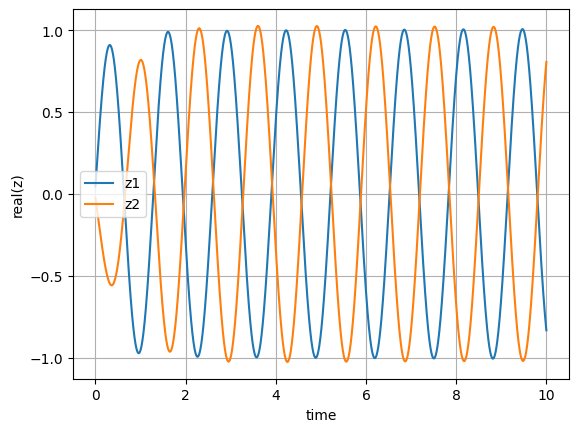

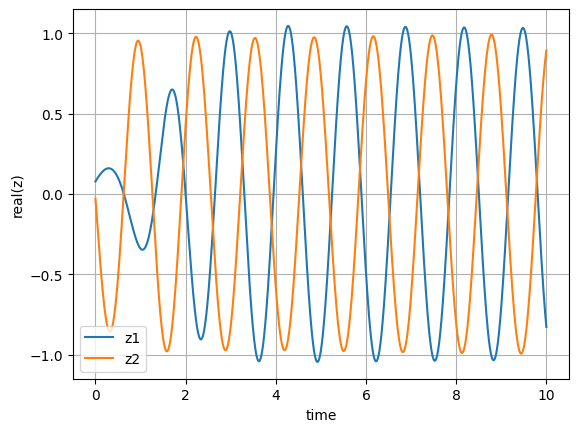

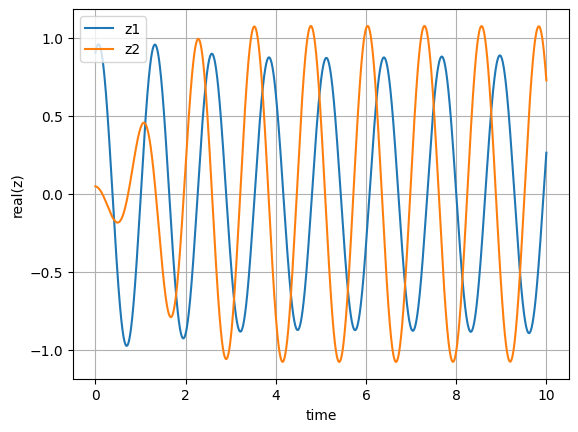

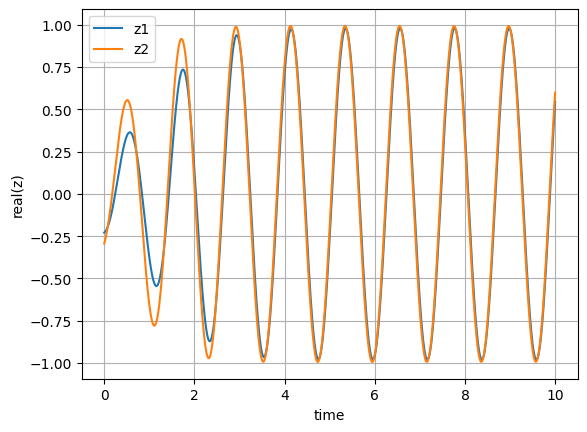

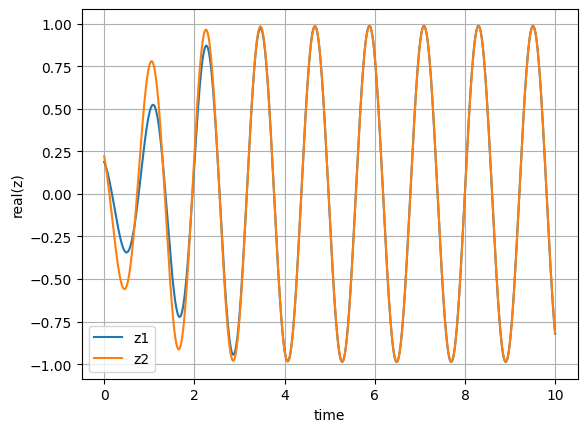

...

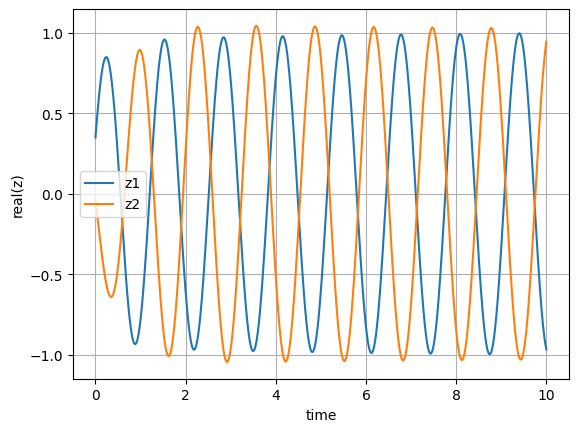

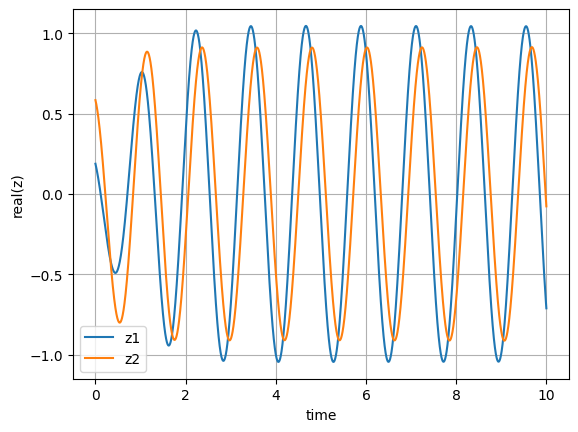

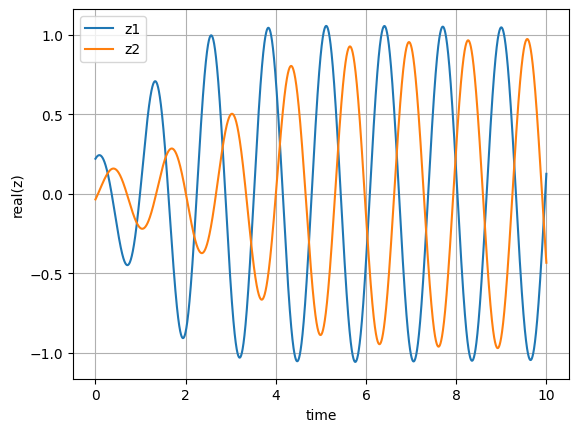

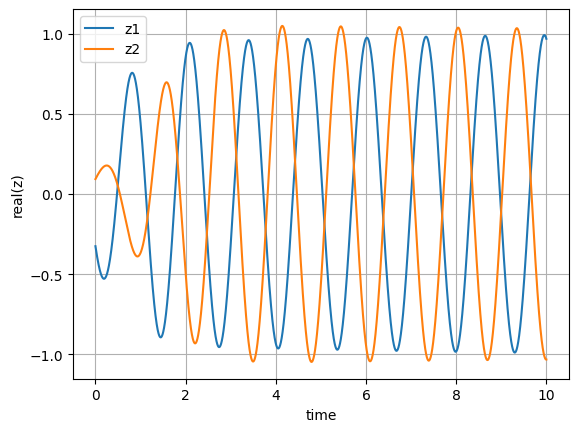

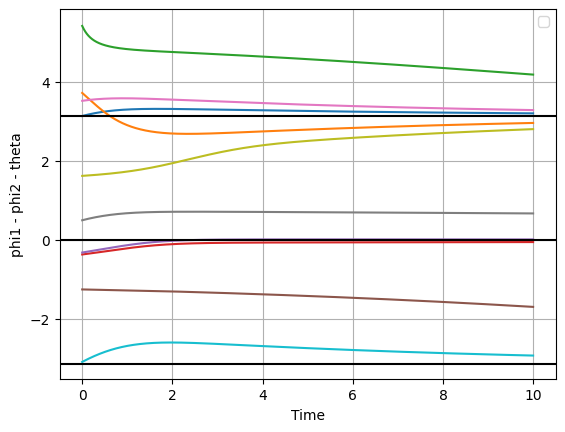

In [179]:
dt = 0.001
tn = 10
omega = 5
mu = 1
A = 0.2
theta = np.deg2rad(98)

r1_tv = []
phi1_tv = []
r2_tv = []
phi2_tv = []

for i in range (10):
    r1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[0])
    phi1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[1])
    r2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[2])
    phi2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tv[i], phi1_tv[i], r2_tv[i], phi2_tv[i], dt)
plot_phase_diff(phi1_tv, phi2_tv, theta, dt)

## Case 5
A = 0.5 and theta = 98 deg

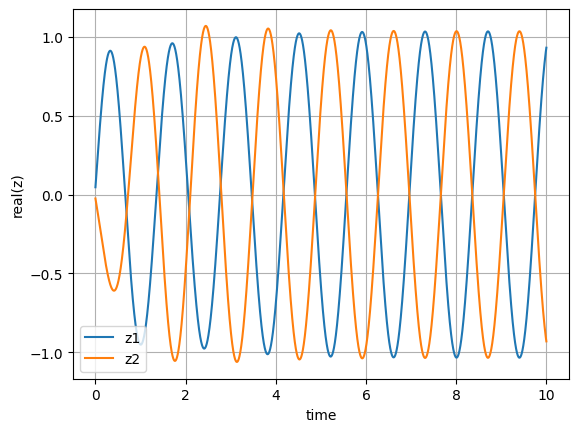

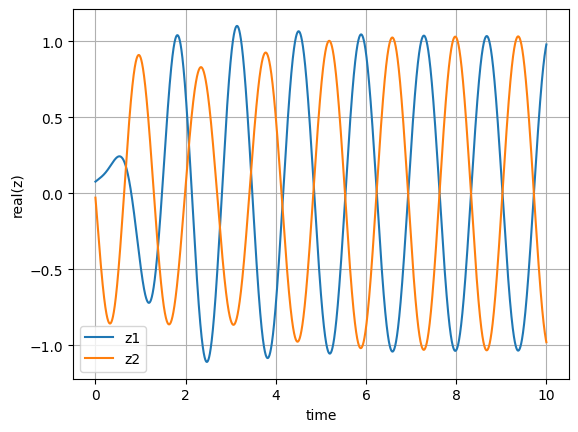

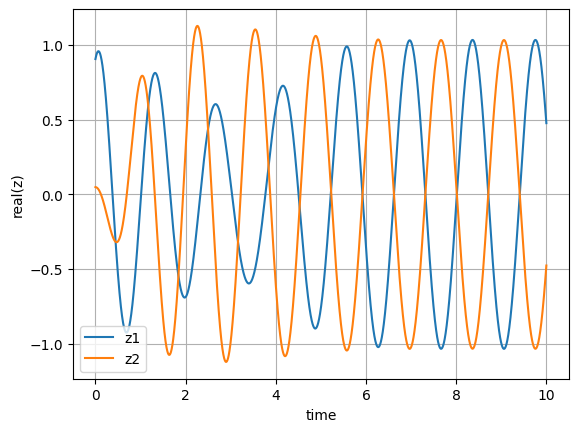

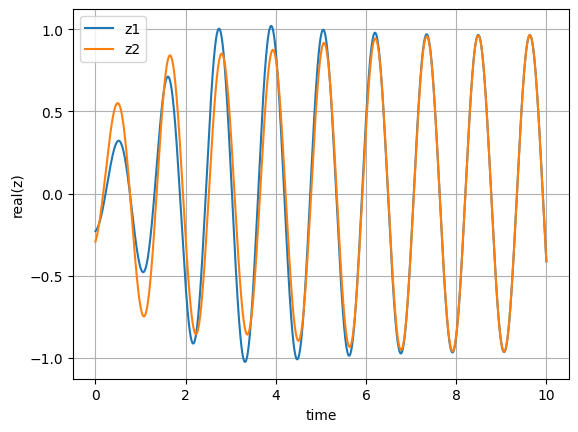

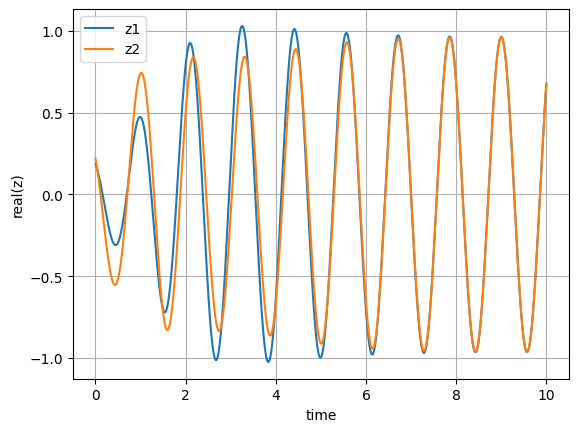

...

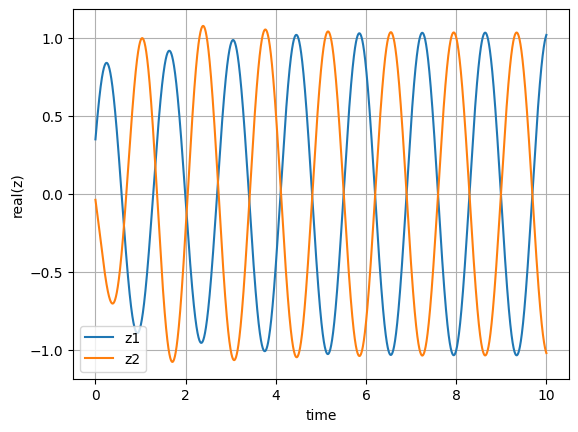

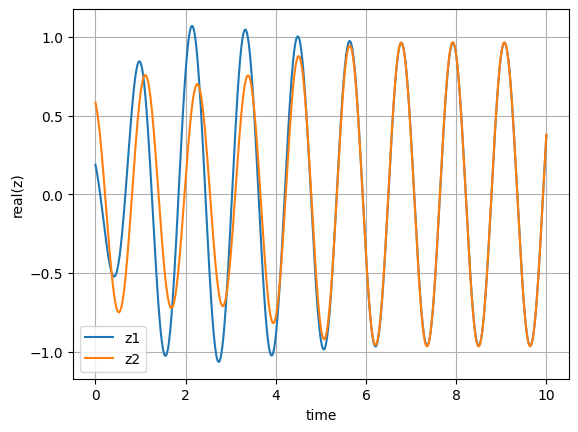

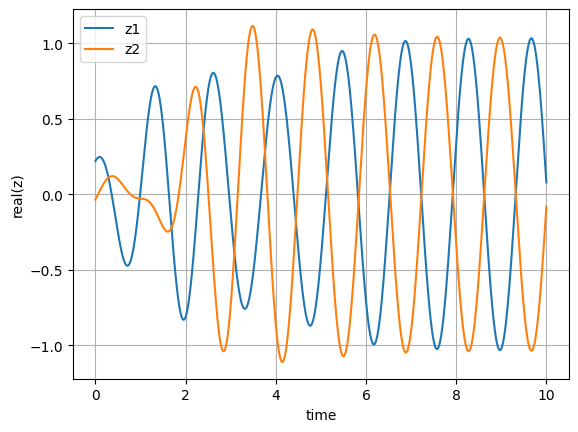

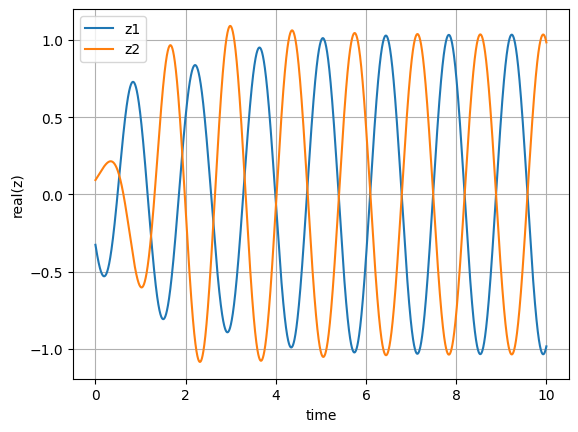

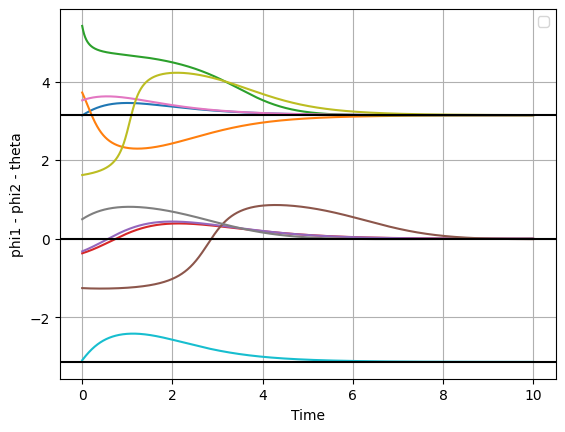

In [180]:
dt = 0.001
tn = 10
omega = 5
mu = 1
A = 0.5
theta = np.deg2rad(98)

r1_tv = []
phi1_tv = []
r2_tv = []
phi2_tv = []

for i in range (10):
    r1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[0])
    phi1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[1])
    r2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[2])
    phi2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tv[i], phi1_tv[i], r2_tv[i], phi2_tv[i], dt)
plot_phase_diff(phi1_tv, phi2_tv, theta, dt)

## Case 6
A = 0.8 and theta = 98 deg

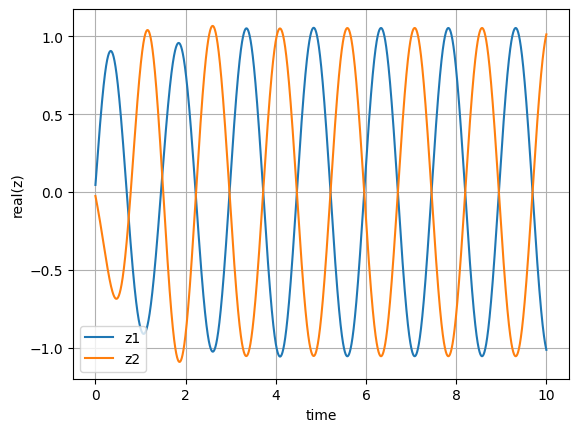

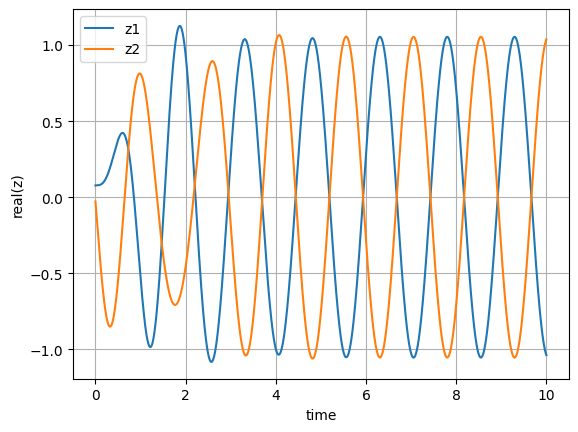

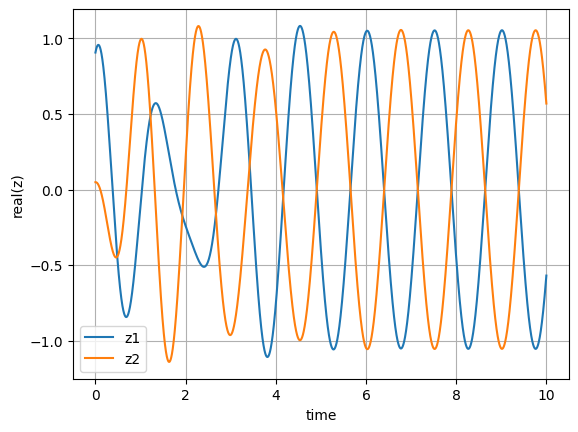

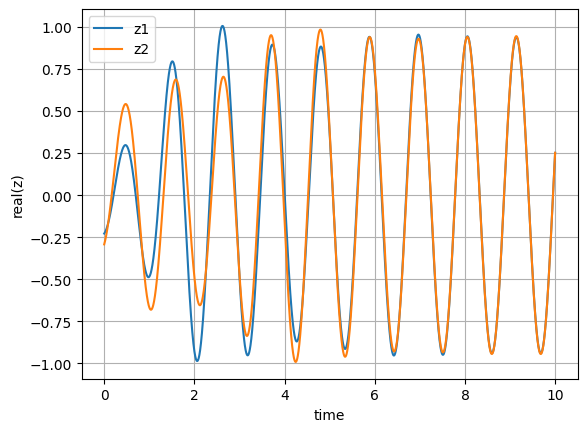

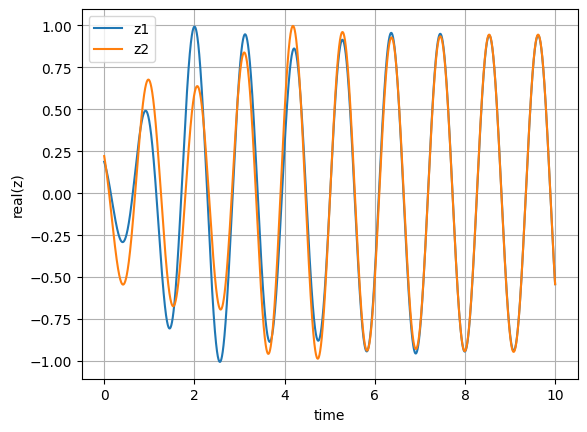

...

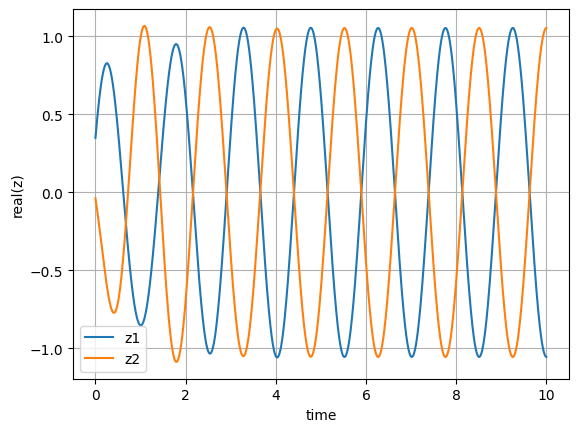

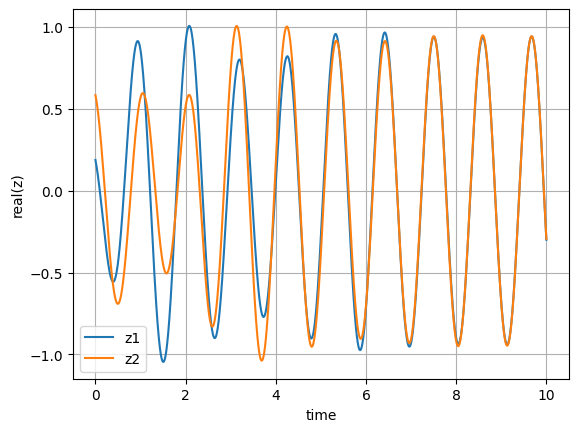

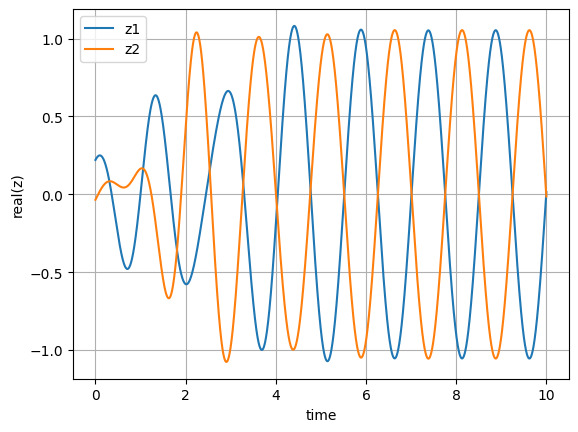

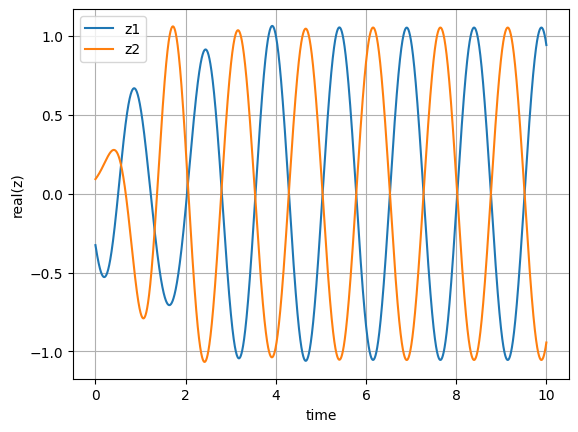

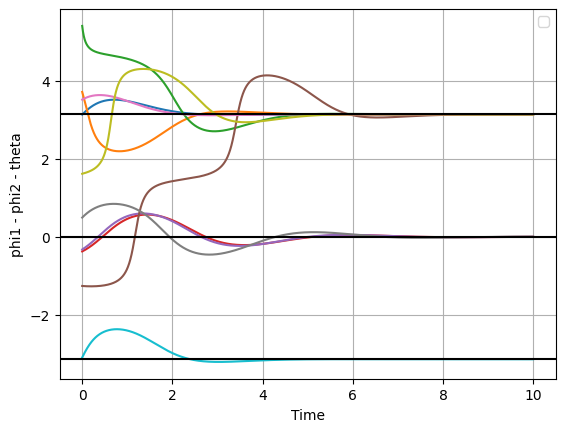

In [181]:
dt = 0.001
tn = 10
omega = 5
mu = 1
A = 0.8
theta = np.deg2rad(98)

r1_tv = []
phi1_tv = []
r2_tv = []
phi2_tv = []

for i in range (10):
    r1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[0])
    phi1_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[1])
    r2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[2])
    phi2_tv.append(euler_integration_complex (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tv[i], phi1_tv[i], r2_tv[i], phi2_tv[i], dt)
plot_phase_diff(phi1_tv, phi2_tv, theta, dt)

## Power Coupling

In [182]:
def power_coupling(r1, r2, phi1, phi2, omega1, omega2, mu, A, theta):
    dr1_dt = (mu - r1**2)*r1 + A*(r2**(omega1/omega2))*np.cos(omega1*((phi2/omega2)-(phi1/omega1)+(theta/(omega1*omega2))))
    dphi1_dt = omega1 +A*((r2**(omega1/omega2))/r1)*np.sin(omega1*((phi2/omega2)-(phi1/omega1)+(theta/(omega1*omega2))))
    dr2_dt = (mu - r2**2)*r2 + A*(r1**(omega2/omega1))*np.cos(omega2*((phi1/omega1)-(phi2/omega2)-(theta/(omega1*omega2))))
    dphi2_dt = omega2 +A*((r1**(omega2/omega1))/r1)*np.sin(omega2*((phi1/omega1)-(phi2/omega2)-(theta/(omega1*omega2))))
    return dr1_dt, dphi1_dt, dr2_dt, dphi2_dt

## Euler Integration for Power Coupling

In [183]:
def euler_integration_power (r1p, phi1p, r2p, phi2p, omega1, omega2, mu, A, theta, dt, tn):
    n = int(tn / dt)
    r1histp = []
    r2histp = []
    phi1histp = []
    phi2histp = []

    for i in range (n):
        dr1p = power_coupling(r1p, r2p, phi1p, phi2p, omega1, omega2, mu, A, theta)[0] * dt
        dphi1p = power_coupling(r1p, r2p, phi1p, phi2p, omega1, omega2, mu, A, theta)[1] * dt
        dr2p = power_coupling(r1p, r2p, phi1p, phi2p, omega1, omega2, mu, A, theta)[2] * dt
        dphi2p = power_coupling(r1p, r2p, phi1p, phi2p, omega1, omega2, mu, A, theta)[3] * dt

        r1p+=dr1p
        phi1p+=dphi1p
        r2p+=dr2p
        phi2p+=dphi2p

        r1histp.append (r1p)
        phi1histp.append (phi1p)
        r2histp.append (r2p)
        phi2histp.append (phi2p)

    return r1histp, phi1histp, r2histp, phi2histp

## Plotting phase change

In [184]:
def plot_phase_diff_power(phi1_tvp, phi2_tvp, omega1, omega2, thetap, dt):
    num_trajectories = len(phi1_tvp)
    time_points = np.arange(0, len(phi1_tvp[0]) * dt, dt)

    plt.figure()

    for i in range(num_trajectories):
        phi1_tp = phi1_tvp[i]
        phi2_tp = phi2_tvp[i]
        phase_diffp = []
        for j in range (len(phi1_tp)):
            phase_diffp.append(phi1_tp[j]/omega1 - phi2_tp[j]/omega2 + thetap/(omega1*omega2))
        plt.plot(time_points, phase_diffp)

    plt.xlabel("Time")
    plt.ylabel("phi1/omega1 - phi2/omega2 + theta/(omega1*omega2")
    plt.legend()
    plt.grid()
    plt.show()

## Case 1
A = 0.2 and theta = -47 deg

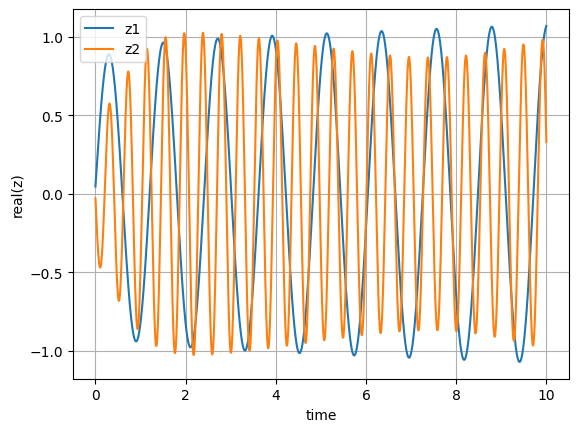

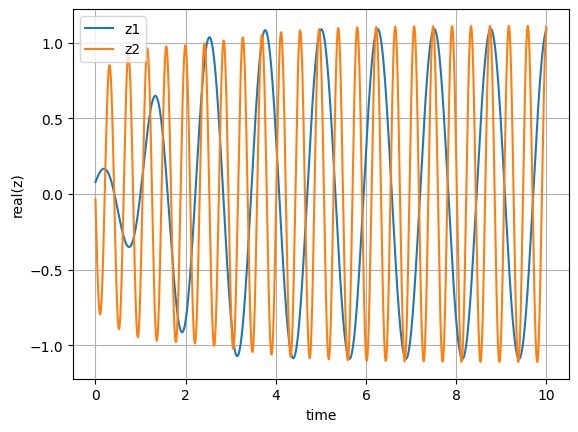

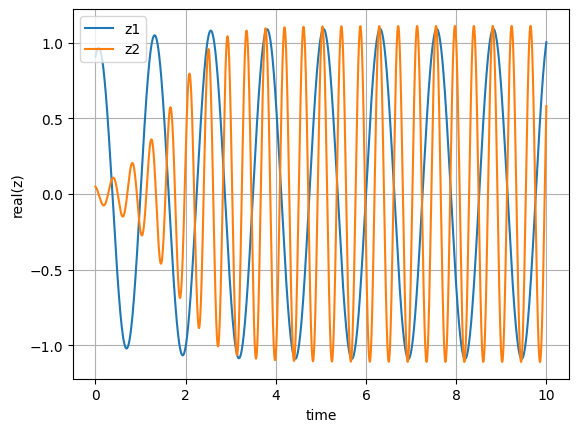

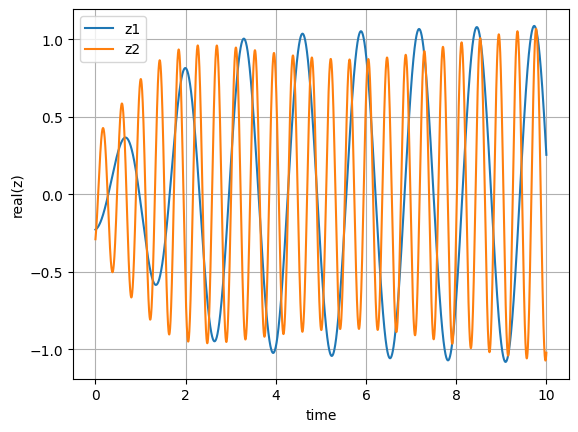

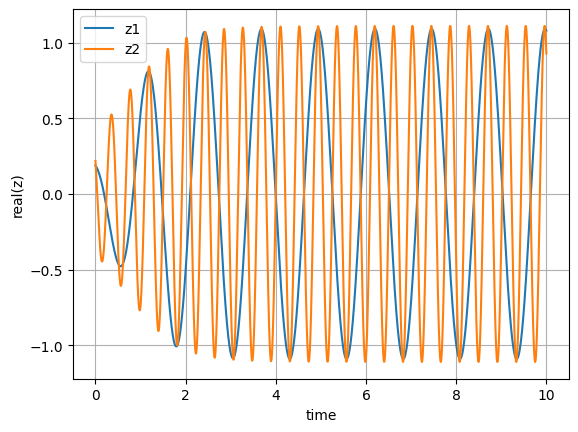

...

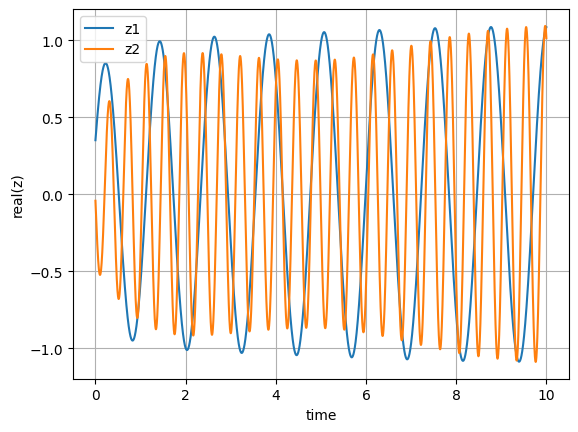

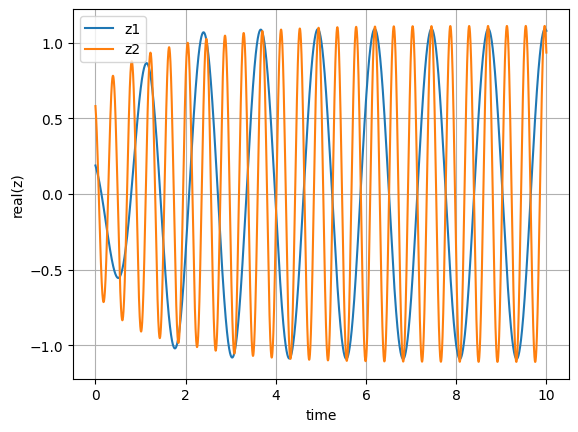

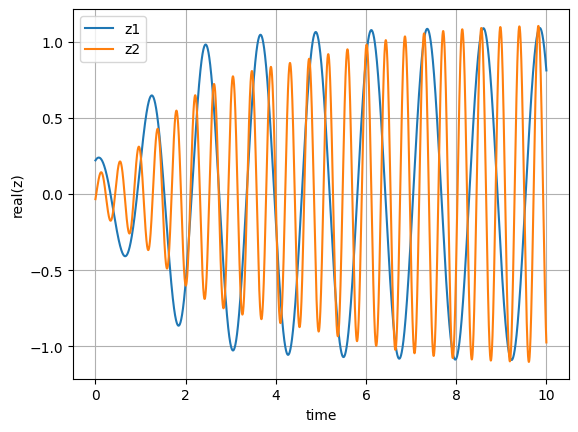

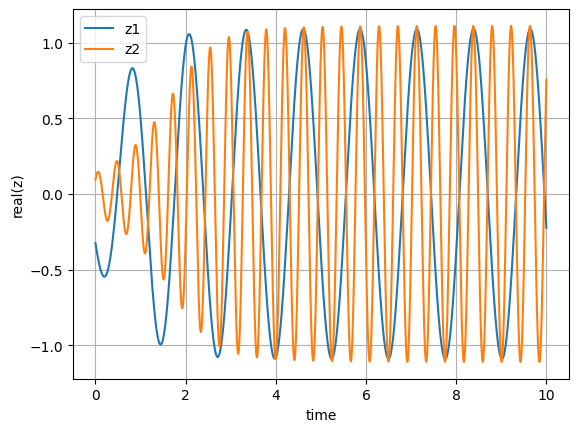

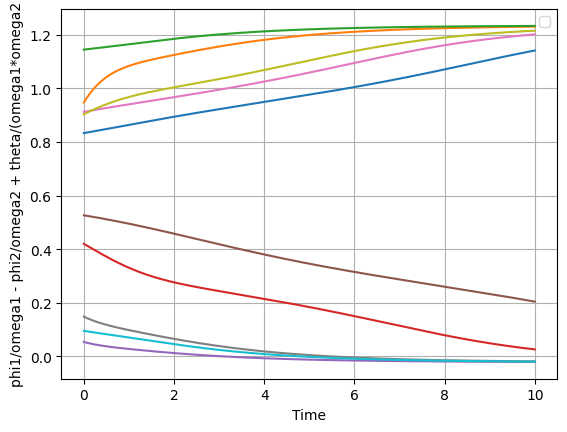

In [185]:
dt = 0.001
tn = 10
omega1 = 5
omega2 = 15
mu = 1
A = 0.2
theta = np.deg2rad(-47)

r1_tvp = []
phi1_tvp = []
r2_tvp = []
phi2_tvp = []

for i in range (10):
    r1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[0])
    phi1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[1])
    r2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[2])
    phi2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tvp[i], phi1_tvp[i], r2_tvp[i], phi2_tvp[i], dt)
plot_phase_diff_power(phi1_tvp, phi2_tvp, omega1, omega2, theta, dt)

## Case 2
A = 0.5 and theta = -47 deg

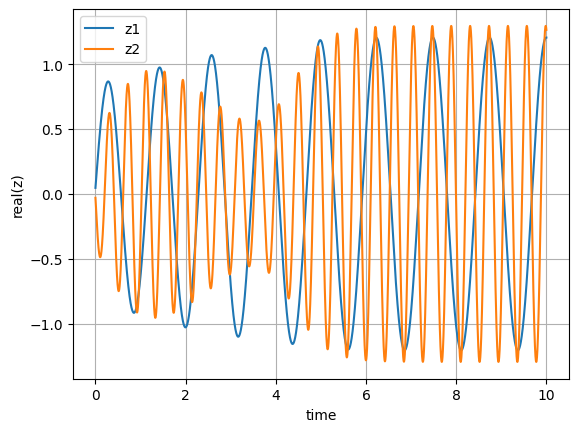

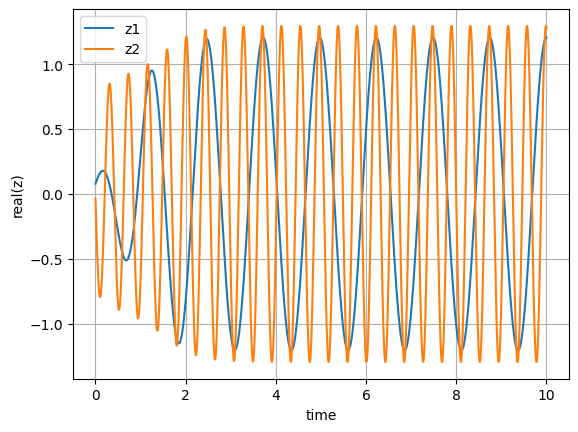

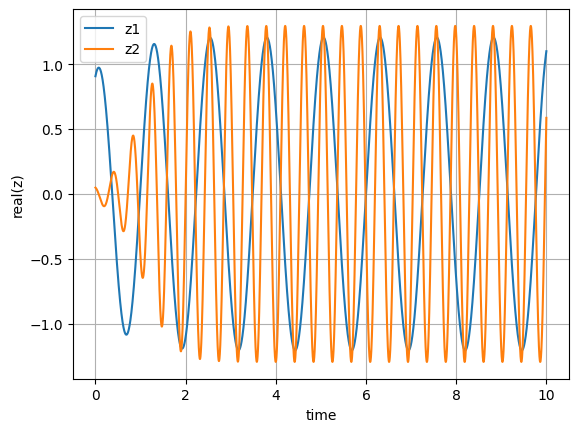

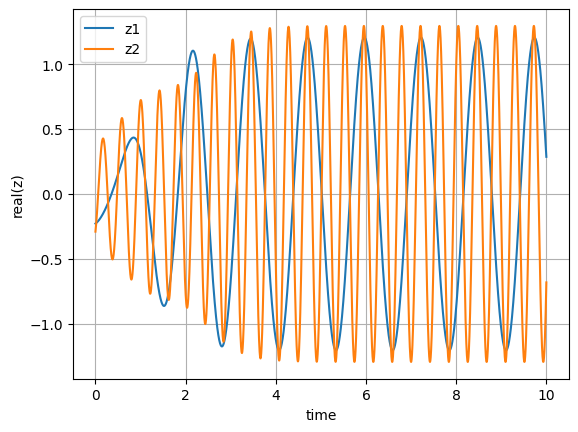

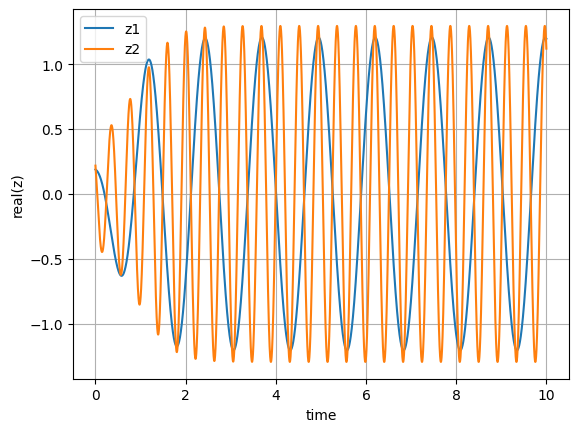

...

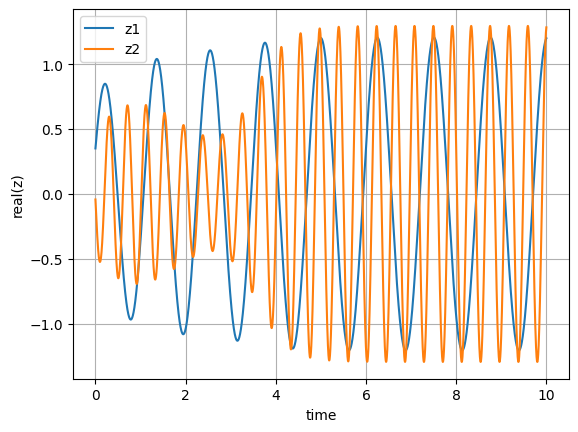

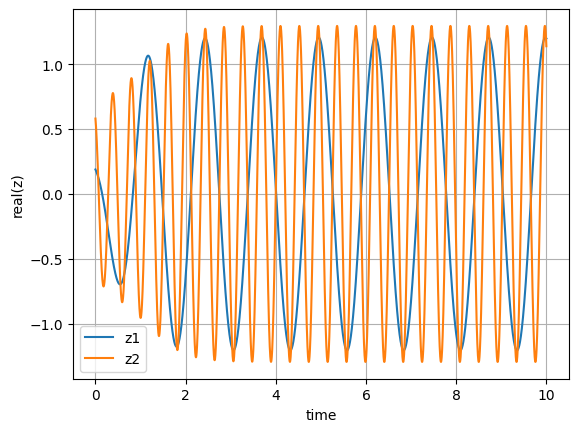

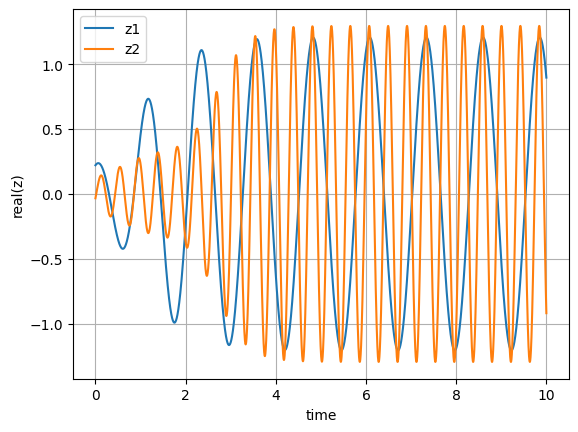

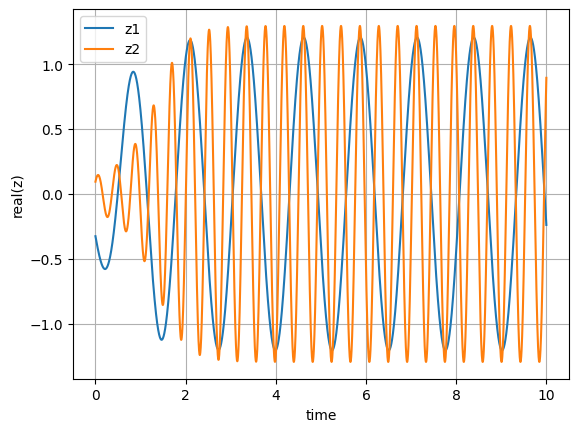

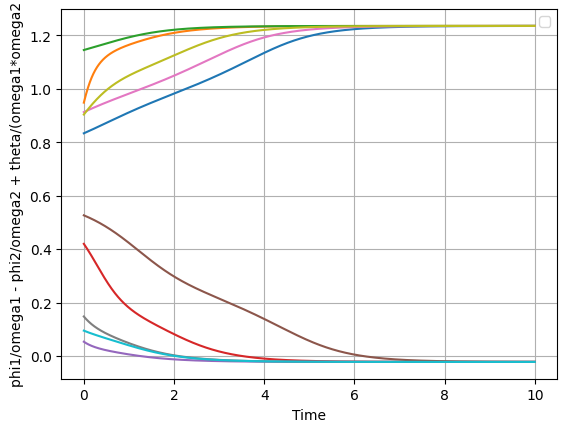

In [186]:
dt = 0.001
tn = 10
omega1 = 5
omega2 = 15
mu = 1
A = 0.5
theta = np.deg2rad(-47)

r1_tvp = []
phi1_tvp = []
r2_tvp = []
phi2_tvp = []

for i in range (10):
    r1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[0])
    phi1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[1])
    r2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[2])
    phi2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tvp[i], phi1_tvp[i], r2_tvp[i], phi2_tvp[i], dt)
plot_phase_diff_power(phi1_tvp, phi2_tvp, omega1, omega2, theta, dt)

## Case 3
A = 0.8 and theta = -47 deg

<ipython-input-182-7014f85c5c8c>:2: RuntimeWarning: invalid value encountered in double_scalars
  dr1_dt = (mu - r1**2)*r1 + A*(r2**(omega1/omega2))*np.cos(omega1*((phi2/omega2)-(phi1/omega1)+(theta/(omega1*omega2))))
<ipython-input-182-7014f85c5c8c>:3: RuntimeWarning: invalid value encountered in double_scalars
  dphi1_dt = omega1 +A*((r2**(omega1/omega2))/r1)*np.sin(omega1*((phi2/omega2)-(phi1/omega1)+(theta/(omega1*omega2))))


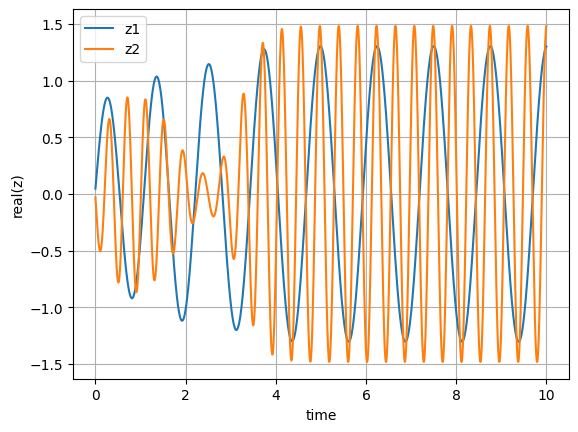

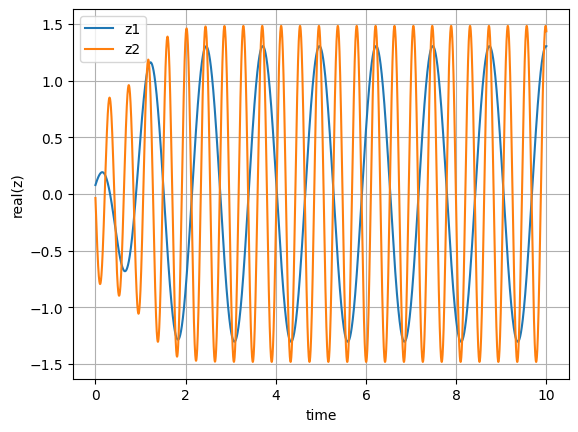

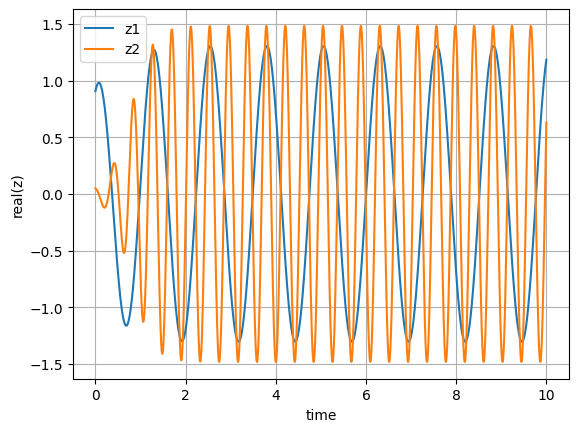

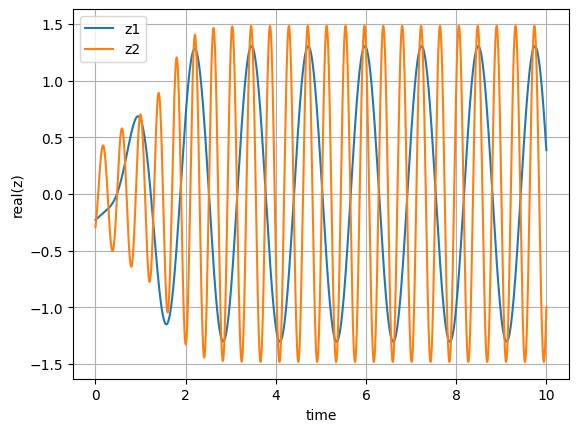

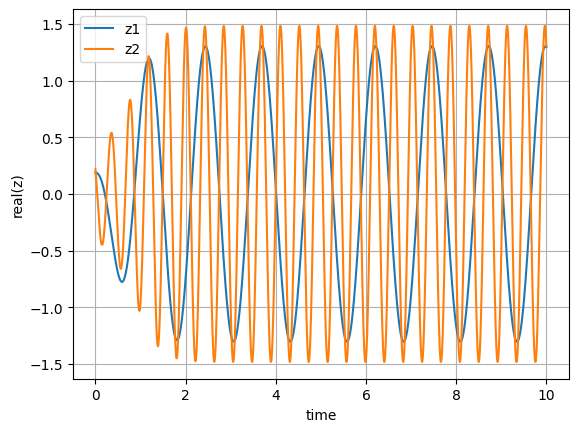

...

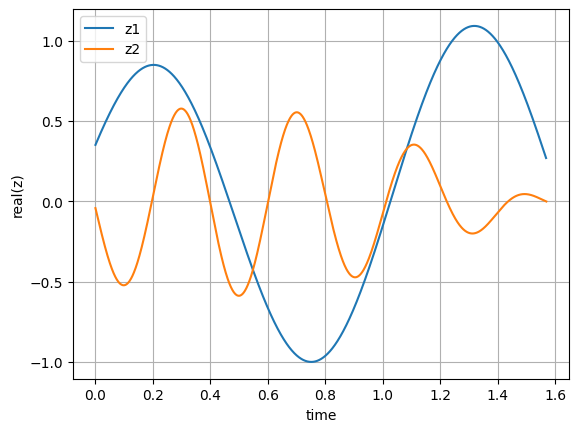

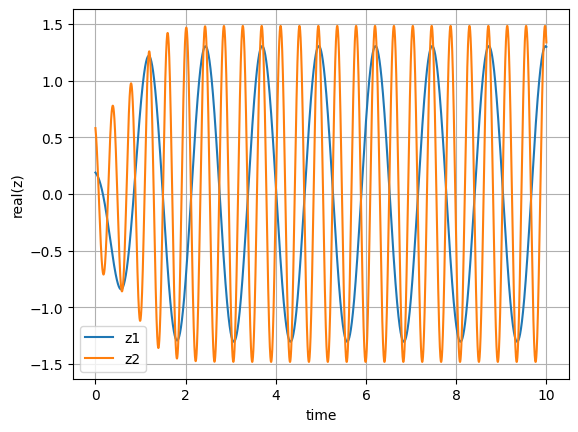

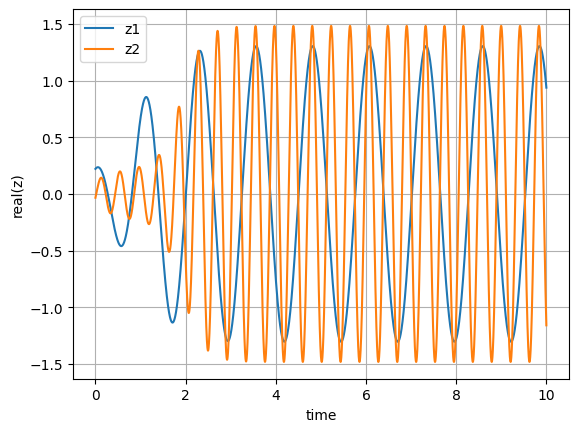

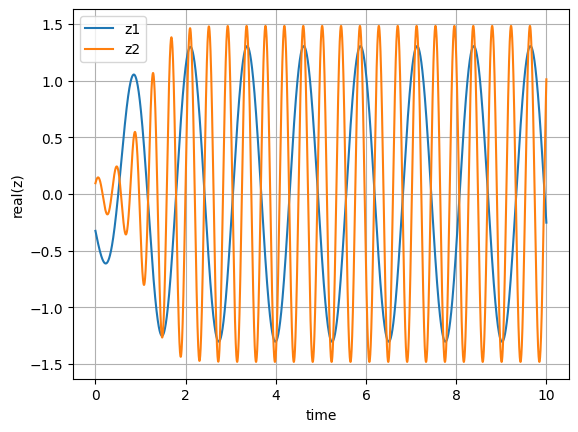

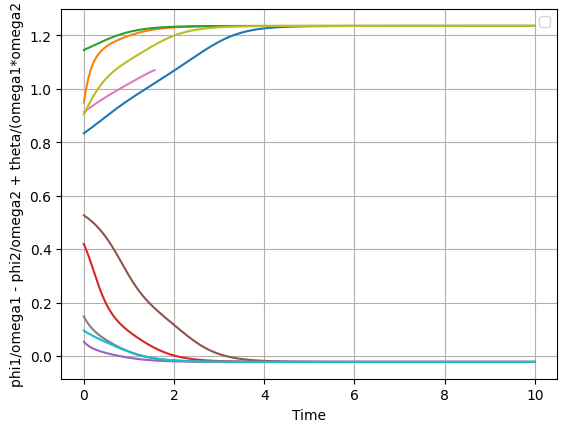

In [187]:
dt = 0.001
tn = 10
omega1 = 5
omega2 = 15
mu = 1
A = 0.8
theta = np.deg2rad(-47)

r1_tvp = []
phi1_tvp = []
r2_tvp = []
phi2_tvp = []

for i in range (10):
    r1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[0])
    phi1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[1])
    r2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[2])
    phi2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tvp[i], phi1_tvp[i], r2_tvp[i], phi2_tvp[i], dt)
plot_phase_diff_power(phi1_tvp, phi2_tvp, omega1, omega2, theta, dt)

## Case 4
A = 0.2 and theta = 98 deg

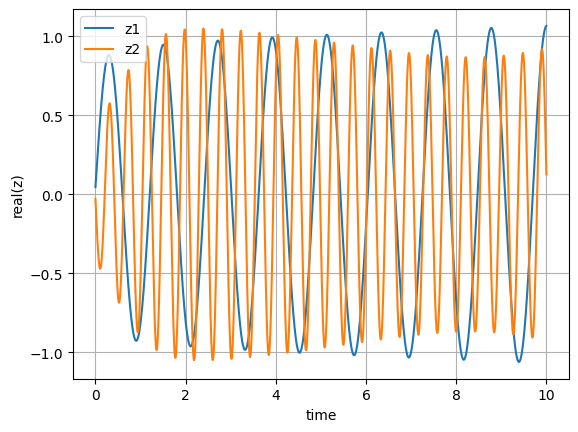

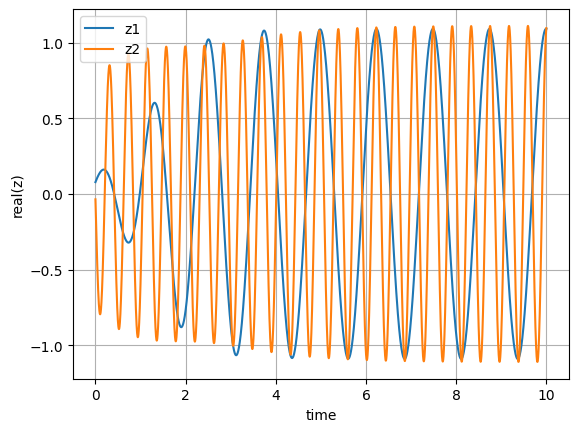

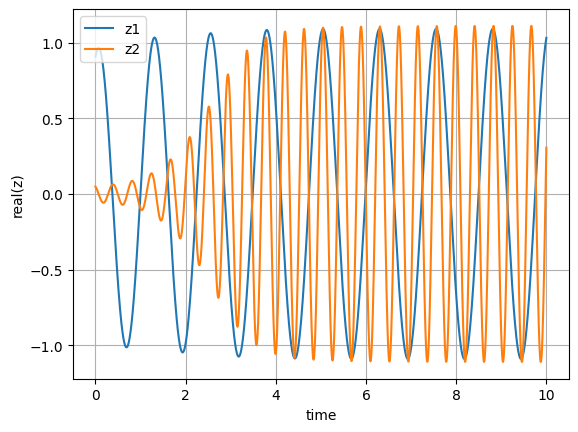

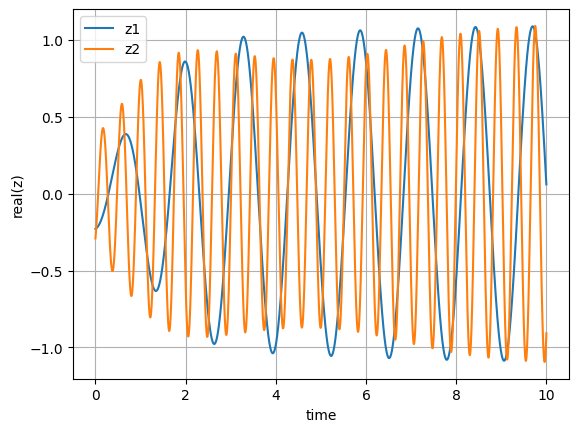

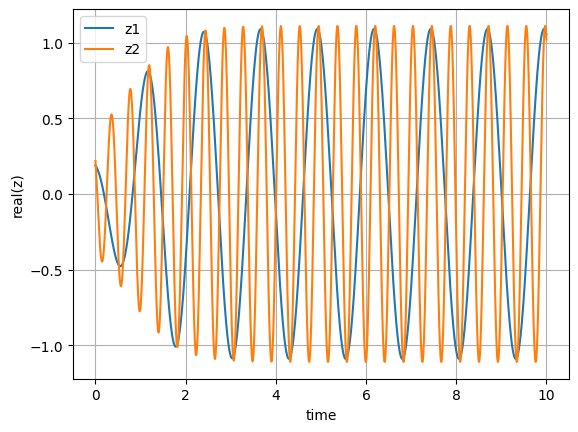

...

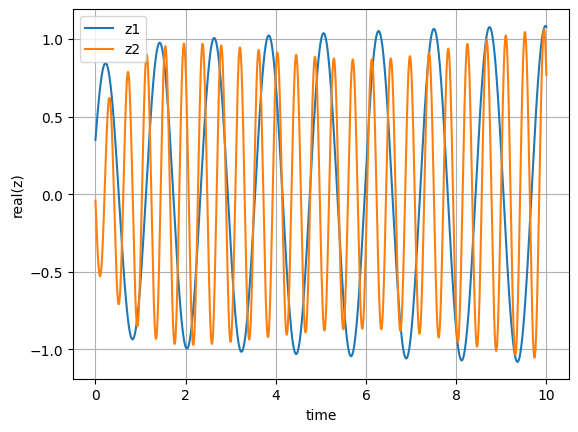

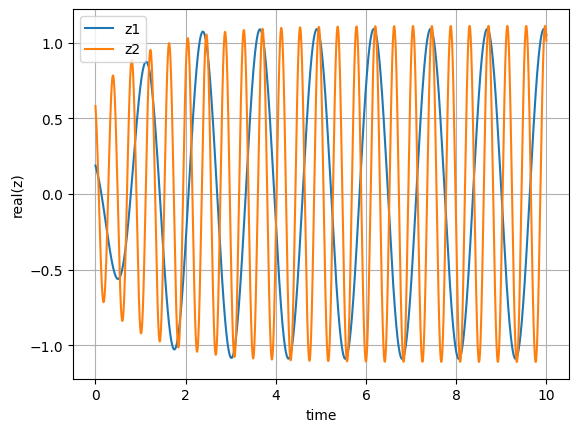

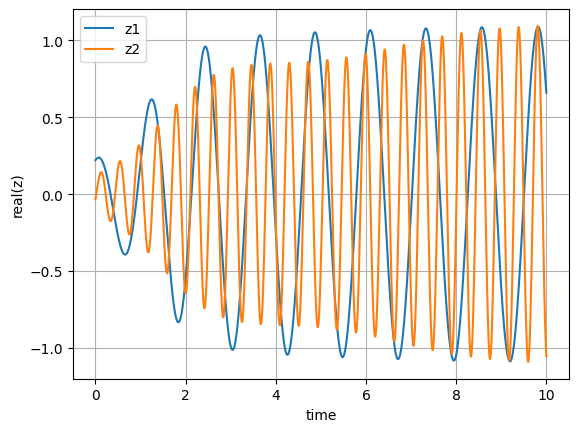

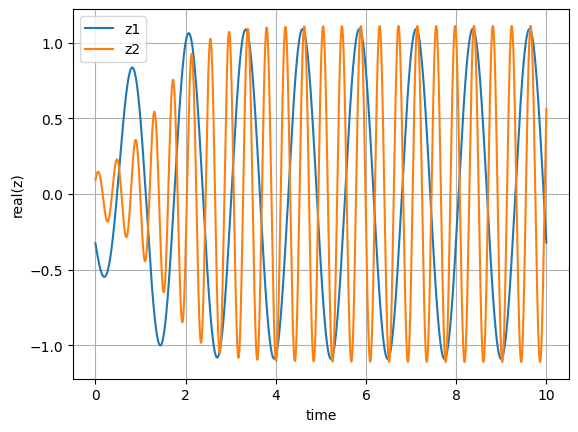

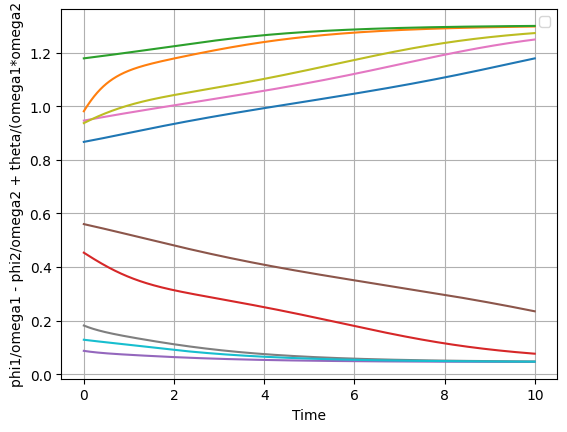

In [188]:
dt = 0.001
tn = 10
omega1 = 5
omega2 = 15
mu = 1
A = 0.2
theta = np.deg2rad(98)

r1_tvp = []
phi1_tvp = []
r2_tvp = []
phi2_tvp = []

for i in range (10):
    r1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[0])
    phi1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[1])
    r2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[2])
    phi2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tvp[i], phi1_tvp[i], r2_tvp[i], phi2_tvp[i], dt)
plot_phase_diff_power(phi1_tvp, phi2_tvp, omega1, omega2, theta, dt)

## Case 5
A = 0.5 and theta = 98 deg

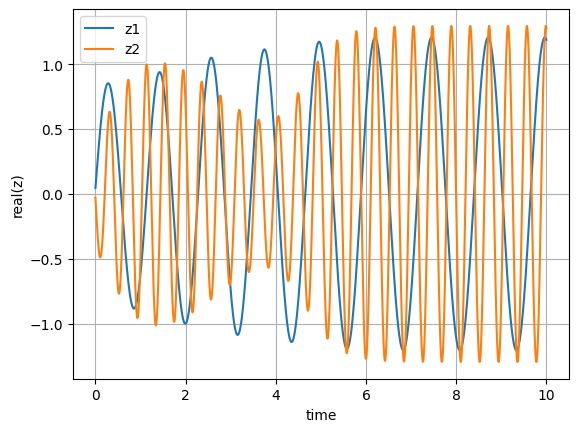

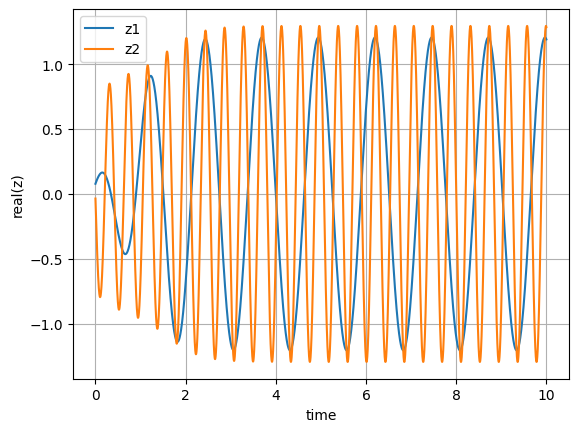

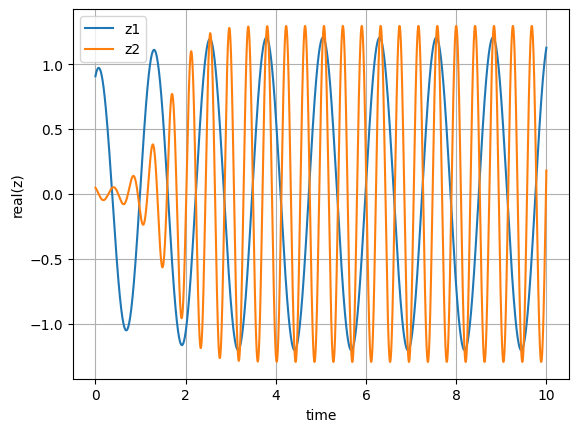

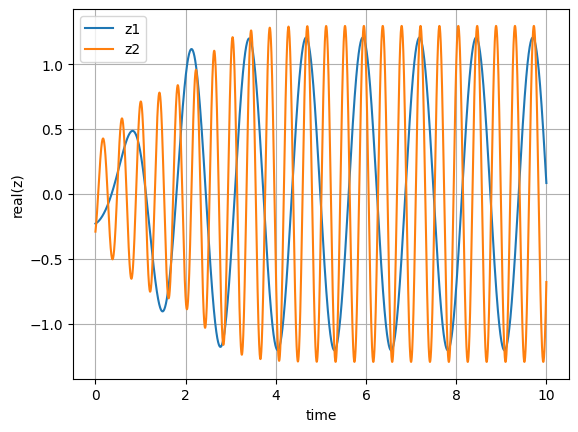

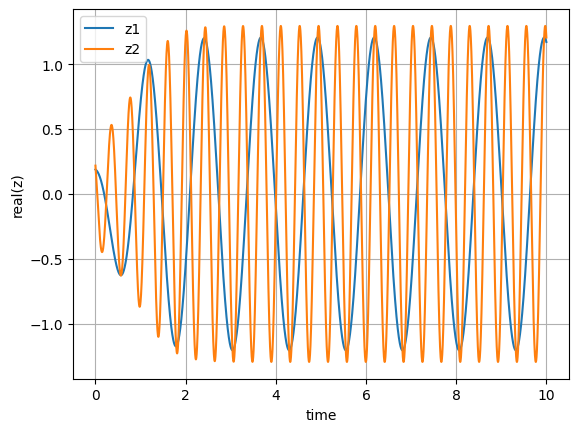

...

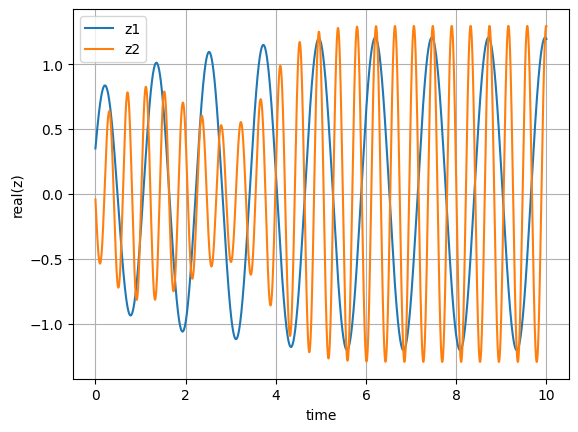

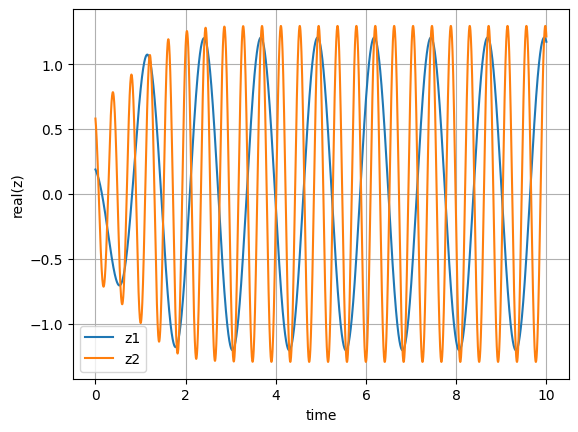

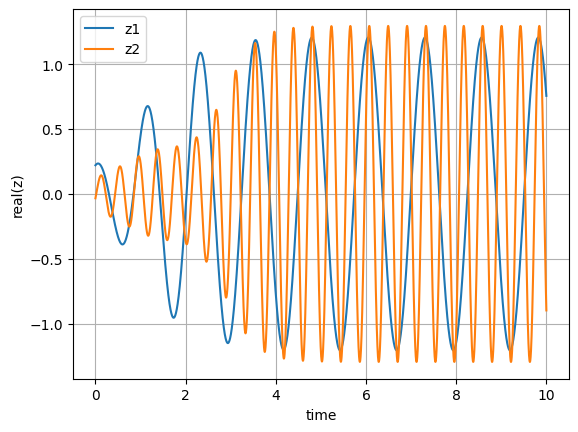

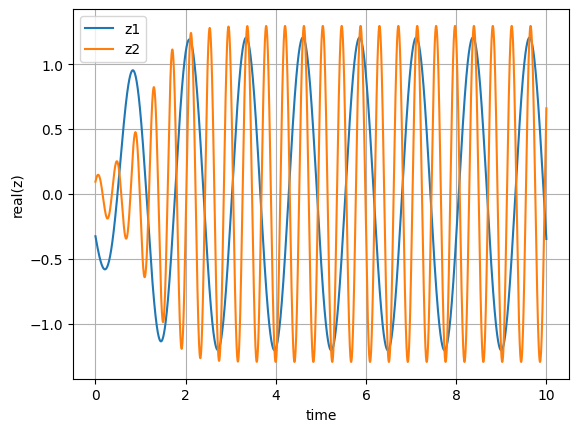

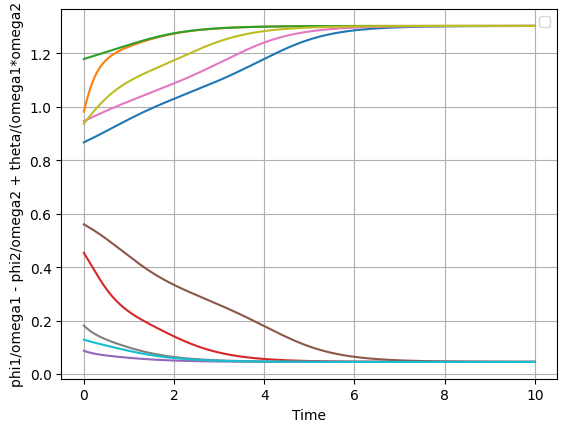

In [189]:
dt = 0.001
tn = 10
omega1 = 5
omega2 = 15
mu = 1
A = 0.5
theta = np.deg2rad(98)

r1_tvp = []
phi1_tvp = []
r2_tvp = []
phi2_tvp = []

for i in range (10):
    r1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[0])
    phi1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[1])
    r2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[2])
    phi2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tvp[i], phi1_tvp[i], r2_tvp[i], phi2_tvp[i], dt)
plot_phase_diff_power(phi1_tvp, phi2_tvp, omega1, omega2, theta, dt)

## Case 6
A = 0.8 and theta = 98 deg

<ipython-input-182-7014f85c5c8c>:2: RuntimeWarning: invalid value encountered in double_scalars
  dr1_dt = (mu - r1**2)*r1 + A*(r2**(omega1/omega2))*np.cos(omega1*((phi2/omega2)-(phi1/omega1)+(theta/(omega1*omega2))))
<ipython-input-182-7014f85c5c8c>:3: RuntimeWarning: invalid value encountered in double_scalars
  dphi1_dt = omega1 +A*((r2**(omega1/omega2))/r1)*np.sin(omega1*((phi2/omega2)-(phi1/omega1)+(theta/(omega1*omega2))))


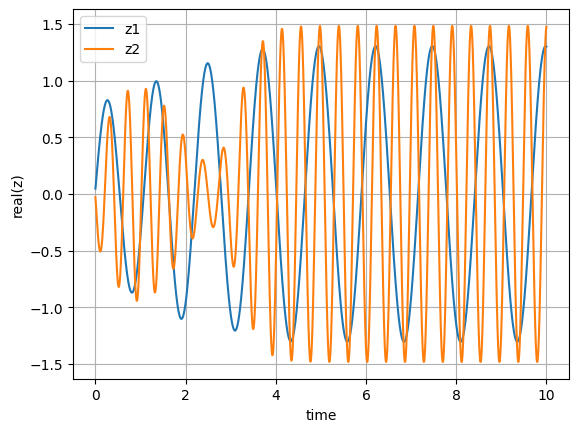

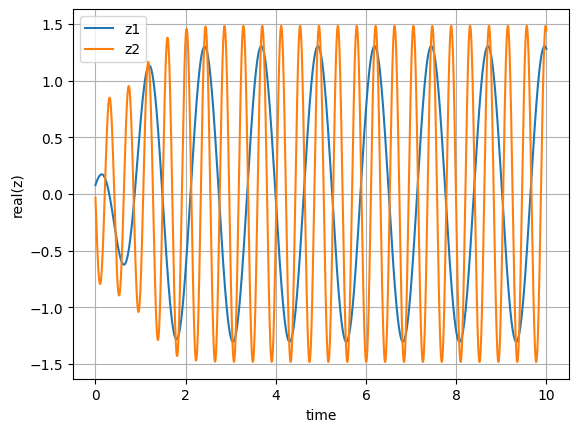

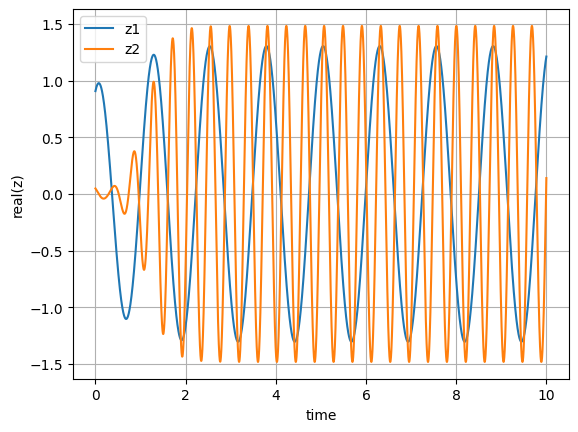

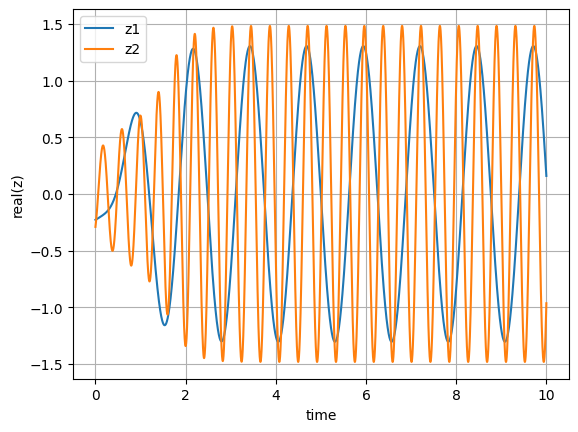

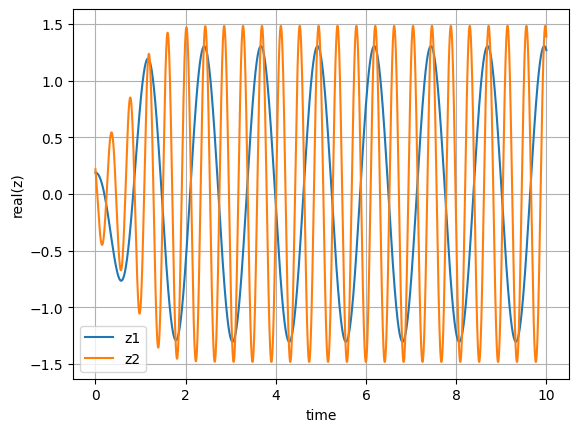

...

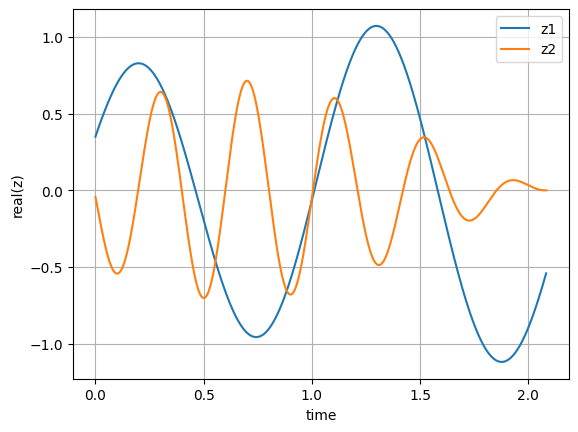

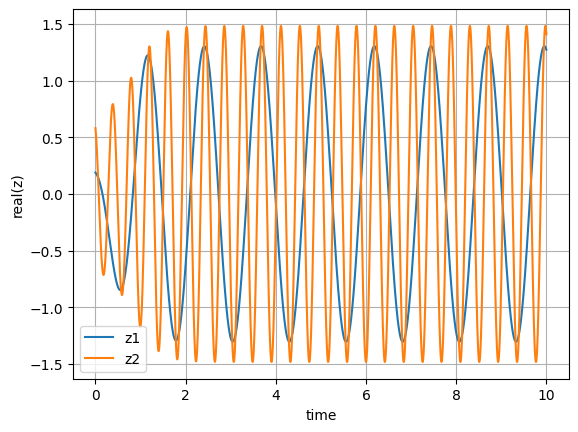

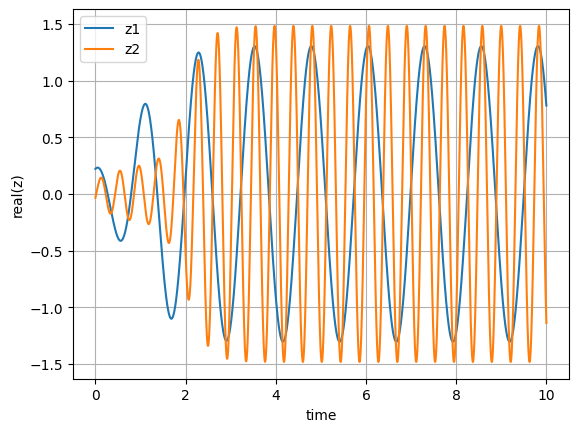

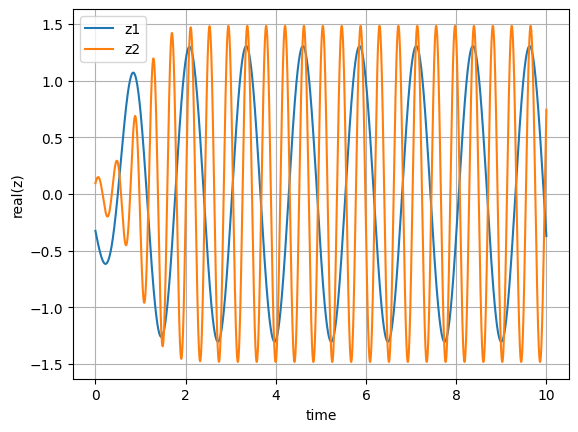

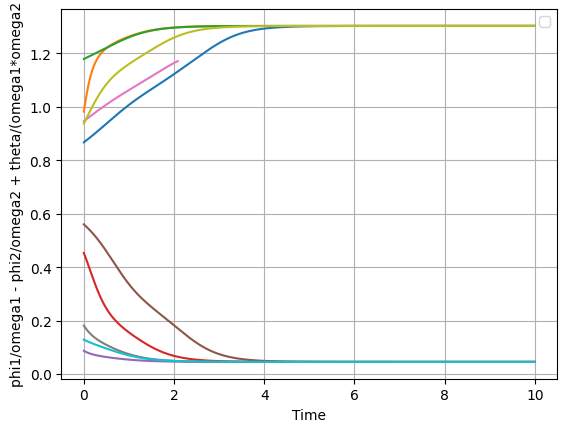

In [190]:
dt = 0.001
tn = 10
omega1 = 5
omega2 = 15
mu = 1
A = 0.8
theta = np.deg2rad(98)

r1_tvp = []
phi1_tvp = []
r2_tvp = []
phi2_tvp = []

for i in range (10):
    r1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[0])
    phi1_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[1])
    r2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[2])
    phi2_tvp.append(euler_integration_power (initial(i)[0], initial(i)[1], initial(i)[2], initial(i)[3], omega1, omega2, mu, A, theta, dt, tn)[3])

for i in range (10):
  plot_realz_t(r1_tvp[i], phi1_tvp[i], r2_tvp[i], phi2_tvp[i], dt)
plot_phase_diff_power(phi1_tvp, phi2_tvp, omega1, omega2, theta, dt)